# CSCK506 – Deep Learning - End of Module Assignment

#### **Authors** : Gauri Mahangare, David Cushing

#### **Date** : 05-Mar-2023

The objective of this notebook is to develop code to train the CNN model to classify x-ray images to detect healthy lungs from pneumonia infected ones.

- Do platform preparation, reading data and feature engineering and training
- Use the training data to train the model with CNN which has the minimum loss and maximum accuracy for detecting the images with pneumonia (Using TensorFlow and Keras is recommended but not obligatory).
In the training choose:
  - Number of convolution-pooling building blocks,
  - The strides, padding and activation function that give you the maximum accuracy,
  - A solution to avoid overfitting problem in your code.

- Use validation dataset if you want to tune the (hyper) parameters in your model and use the test dataset after the final tuning to obtain the maximum test accuracy.

---



**Part 1: Download Dataset and Explore**
In this section, we download the dataset, explore the folders, visulaise the images loaded using Keras utilitiy library.

**Part 2: Define the model and parameters and start training**

In this section, we create reusable model functions and test the models with various activation functions, optimisers, number of convolution layers etc to find the base model

**Part 3: Hyper Parameter Tuning**

In this section, we user Keras Tuner library to implement the hyper parameter tuning using two approaches- Hyperband Tuner and RamndomSearch Tuner. These tuners identify the best parameters to be used and the model is retrained using these parameters and the accuracy is cross validated using test data set.

---



# **Part 1:** Download the dataset and explore

## Download the dataset

**NOTE**
*Kaggle JASON that stores the API key of your kaggle account is needed in the google drive (location - /content/drive/MyDrive/kaggle.json) inorder to download the data set from Kaggle.*

In [1]:
# Access Google Drive
from google.colab import drive
drive.mount('/content/drive/')


Mounted at /content/drive/


In [2]:
# Access Kaggle account
! pip install -q kaggle
! mkdir ~/.kaggle # Create kaggle folder in roote directory
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json # Copy the Kaggle account API key to access Kaggle datasets via notebook
! chmod 600 ~/.kaggle/kaggle.json # Set appropriate permissions on the key file

In [3]:
# Search the kaggle dataset
!kaggle datasets list -s paultimothymooney/chest-xray-pneumonia

ref                                                             title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
pcbreviglieri/pneumonia-xray-images                             Pneumonia X-Ray Images                                1GB  2020-05-18 14:32:09           6154         74  0.9375           
jtiptj/chest-xray-pneumoniacovid19tuberculosis                  Chest X-Ray (Pneumonia,Covid-19,Tuberculosis)         2GB  2021-09-16 06:21:54           3563         59  0.8125           
tawsifurrahman/covid19-radiography-database                     COVID-19 Radiography Database                       778MB  2022-03-19 13:38:42          61761        807  1.0              
prashant268/chest-xray-covid19-pneumonia                    

In [4]:
# Download the dataset
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia -p /content/kaggle/

 99% 2.28G/2.29G [00:17<00:00, 153MB/s]
100% 2.29G/2.29G [00:17<00:00, 142MB/s]


In [5]:
# Unzip the files
!unzip /content/kaggle/chest-xray-pneumonia.zip


Streaming output truncated to the last 5000 lines.
  inflating: chest_xray/train/NORMAL/IM-0435-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0441-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0442-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0444-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0445-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0446-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0447-0001.jpeg  
  inflating:

In [6]:
!pip install keras_tuner

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.3/167.3 KB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 53.3 MB/s eta 0:00:00


## Exploratory Analysis

In [7]:
import sklearn
import tensorflow as tf
import pandas as pd
import numpy as np
import struct
import random
import os
import pathlib
import warnings
import shutil
import tempfile
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

import PIL
import PIL.Image
# import tensorflow_datasets as tfds

from tensorflow import keras
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from pathlib import Path
from packaging import version

from array import array
from os.path  import join

warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
from IPython.core.interactiveshell import InteractiveShell
from sklearn.metrics import classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers 
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score

from  IPython import display
from matplotlib import pyplot as plt

import keras_tuner as kt


import numpy as np

import pathlib
import shutil
import tempfile

In [8]:
!pip install git+https://github.com/tensorflow/docs

import tensorflow_docs as tfdocs
import tensorflow_docs.modeling
import tensorflow_docs.plots
import datetime
from tensorboard.plugins.hparams import api as hp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-41ib80t4
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-41ib80t4
  Resolved https://github.com/tensorflow/docs to commit 393d7b6fa6aa68a8e01013582cbdb5c0fe4fde1c
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=182571 sha256=0da5c7dab8906e247af11f9e491f9488d59d3e75a92b2381350a95a6c2c92d86
  Stored in directory: /tmp/pip-ephem-wheel-cache-luvtgybg/wheels/fc/f8/3b/5d21409a59cb1be9b1ade11f682039ced75b84de9dd6a0c8de
Successfully built tensorflow-docs


In [9]:
logdir = pathlib.Path(tempfile.mkdtemp())/"tensorboard_logs"
shutil.rmtree(logdir, ignore_errors=True)

In [10]:
print(logdir)

/tmp/tmpmfgzush0/tensorboard_logs


In [11]:
mpl.rcParams['figure.figsize'] = (12, 8)
mpl.rcParams['legend.loc']  = 'best'
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [12]:
print(sklearn.__version__)
assert version.parse(sklearn.__version__) >= version.parse("1.0.1")

1.2.2


In [13]:
print(tf.__version__)
assert version.parse(tf.__version__) >= version.parse("2.8.0")

2.11.0


In [14]:
print(pd.__version__)
print(np.__version__)

1.4.4
1.22.4


In [15]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [16]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
  try:
    tf.config.set_visible_devices(gpus[0], 'GPU')
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
  except RuntimeError as e:
    # Visible devices must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPU


In [17]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Mar 19 21:41:43 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P0    29W /  70W |    339MiB / 15360MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

 let's define the default font sizes to make the figures prettier

In [18]:
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

And let's create the images/CSCK506-EndModuleAssignment folder (if it doesn't already exist), and define the save_fig() function which is used through this notebook to save the figures in high-res for the book:

In [19]:
IMAGES_PATH = Path() / "images" / "CSCK506-EndModuleAssignment"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In [20]:
#pd.set_option('display.max_rows', None)
InteractiveShell.ast_node_interactivity = "all"
# pd.set_option('display.max_columns', None)
# pd.set_option('display.height', 1000)
# pd.set_option('display.max_rows', 500)
# pd.set_option('display.max_columns', 500)
# pd.set_option('display.width', 1000)

Load and prepare the image data using Keras 
https://www.tensorflow.org/tutorials/load_data/images#load_data_using_a_keras_utility

In [21]:
data_dir = "/content/chest_xray/chest_xray"
data_dir_test = "/content/chest_xray/chest_xray/test"
data_dir_test_normal = "/content/chest_xray/chest_xray/test/NORMAL"
data_dir_test_pneumonia = "/content/chest_xray/chest_xray/test/PNEUMONIA/"
data_dir_train = "/content/chest_xray/chest_xray/train"
data_dir_train_normal = "/content/chest_xray/chest_xray/train/NORMAL"
data_dir_train_pneumonia = "/content/chest_xray/chest_xray/train/PNEUMONIA"
data_dir_val = "/content/chest_xray/chest_xray/val"
data_dir_val_normal = "/content/chest_xray/chest_xray/val/NORMAL"
data_dir_val_pneumonia = "/content/chest_xray/chest_xray/val/PNEUMONIA"

In [22]:
data_dir_path = pathlib.Path(data_dir).with_suffix('')
data_dir_test_path = pathlib.Path(data_dir_test).with_suffix('')
data_dir_test_normal_path = pathlib.Path(data_dir_test_normal).with_suffix('')
data_dir_test_pneumonia_path = pathlib.Path(data_dir_test_pneumonia).with_suffix('')
data_dir_train_path = pathlib.Path(data_dir_train).with_suffix('')
data_dir_train_normal_path = pathlib.Path(data_dir_train_normal).with_suffix('')
data_dir_train_pneumonia_path = pathlib.Path(data_dir_train_pneumonia).with_suffix('')
data_dir_val_path = pathlib.Path(data_dir_val).with_suffix('')
data_dir_val_normal_path = pathlib.Path(data_dir_val_normal).with_suffix('')
data_dir_val_pneumonia_path = pathlib.Path(data_dir_val_pneumonia).with_suffix('')

In [23]:
images1=len(list(data_dir_path.glob('*.jpeg')))
print("Image count in main directory: " + str(images1))

print("============")
images2=len(list(data_dir_test_path.glob('*.jpeg')))
print("Image count in test directory: " + str(images2))

images3=len(list(data_dir_test_normal_path.glob('*.jpeg')))
print("Image count in test-NORMAL directory: " + str(images3))

images4=len(list(data_dir_test_pneumonia_path.glob('*.jpeg')))
print("Image count in test-PNEUMONIA directory: " + str(images4))
tot_test_images = images3+images4
print("Total Image count in Test directory: " + str(tot_test_images))


print("============")
images5=len(list(data_dir_train_path.glob('*.jpeg')))
print("Image count in train directory: " + str(images5))

images6=len(list(data_dir_train_normal_path.glob('*.jpeg')))
print("Image count in train-NORMAL directory: " + str(images6))

images7=len(list(data_dir_train_pneumonia_path.glob('*.jpeg')))
print("Image count in train-PNEUMONIA directory: " + str(images7))

tot_train_images = images6+images7
print("Total Image count in Train directory: " + str(tot_train_images))

print("============")
images8=len(list(data_dir_val_path.glob('*.jpeg')))
print("Image count in val directory: " + str(images8))

images9=len(list(data_dir_val_normal_path.glob('*.jpeg')))
print("Image count in val-NORMAL directory: " + str(images9))

images10=len(list(data_dir_val_pneumonia_path.glob('*.jpeg')))
print("Image count in val-PNEUMONIA directory: " + str(images10))

tot_val_images = images9+images10
print("Total Image count in Validation directory: " + str(tot_val_images))


Image count in main directory: 0
Image count in test directory: 0
Image count in test-NORMAL directory: 234
Image count in test-PNEUMONIA directory: 390
Total Image count in Test directory: 624
Image count in train directory: 0
Image count in train-NORMAL directory: 1341
Image count in train-PNEUMONIA directory: 3875
Total Image count in Train directory: 5216
Image count in val directory: 0
Image count in val-NORMAL directory: 8
Image count in val-PNEUMONIA directory: 8
Total Image count in Validation directory: 16


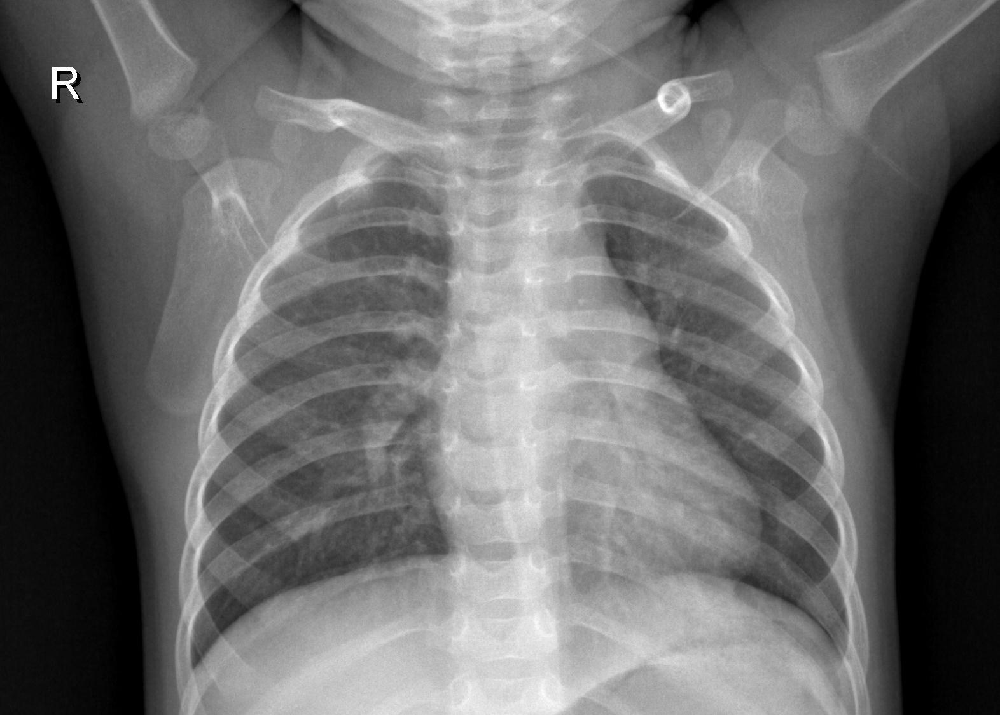

In [24]:
xrays = list(data_dir_test_normal_path.glob('*.jpeg'))
i = random.randint(0,images3)
PIL.Image.open(str(xrays[i]))

## Load data using a Keras utility

In [25]:
# Function to read image data from the directory
def load_image_dataset_from_directory(path,img_height,img_width,batch_size,validation_split,subset,label_mode):
  dataset = tf.keras.utils.image_dataset_from_directory(
    path,
    labels='inferred',
    class_names=["NORMAL","PNEUMONIA"],
    image_size=(img_height, img_width),
    color_mode='grayscale',
    validation_split=validation_split,
    label_mode=label_mode,
    shuffle=True,
    subset=subset,
    seed=500,
    interpolation="bilinear",
    crop_to_aspect_ratio=False,
    batch_size=batch_size)
  return dataset

In [26]:
def get_shape(ds):
    for image_batch, labels_batch in ds :
        print(image_batch.shape)
        print(labels_batch.shape)
        break
    print("Number of batches created in the dataset is: " + str(len(ds)))

In [27]:
# Constants used in the data processing
img_height=120
img_width=120
batch_size=300
class_names = ["NORMAL", "PNEUMONIA"]
channels = 1

In [28]:
# Load test data set
path = data_dir_test_path
validation_split=None
subset=None
label_mode='int'
data_test = load_image_dataset_from_directory(path,img_height,img_width,batch_size,validation_split,subset,label_mode)
get_shape(data_test)

Found 624 files belonging to 2 classes.
(300, 120, 120, 1)
(300,)
Number of batches created in the dataset is: 3


In [29]:
# Load train data set. We will split the trainingdataset as validation dataset in the orignial data from Kaggle only has 16 images. 
path = data_dir_train_path
validation_split=0.1
subset="training"
label_mode='int'
data_train = load_image_dataset_from_directory(path,img_height,img_width,batch_size,validation_split,subset,label_mode)
get_shape(data_train)

Found 5216 files belonging to 2 classes.
Using 4695 files for training.
(300, 120, 120, 1)
(300,)
Number of batches created in the dataset is: 16


In [30]:
# Load validation data set. We will split the training dataset as validation dataset in the orignial data from Kaggle only has 16 images. 
path = data_dir_train_path
validation_split=0.1
subset="validation"
label_mode='int'

nbr_of_validation_images = int(tot_train_images*validation_split)
print("Number of validation Images : " + str(nbr_of_validation_images))
nbr_of_training_images = tot_train_images - nbr_of_validation_images
print("Number of Training Images : " + str(nbr_of_training_images))

data_val = load_image_dataset_from_directory(path,img_height,img_width,batch_size,validation_split,subset,label_mode)
get_shape(data_val)

Number of validation Images : 521
Number of Training Images : 4695
Found 5216 files belonging to 2 classes.
Using 521 files for validation.
(300, 120, 120, 1)
(300,)
Number of batches created in the dataset is: 2


In [31]:
# Loading vaidation dataset provided from the orignal Kaggle data.
path = data_dir_val_path
validation_split=None
subset=None
label_mode='int'
data_val_orig= load_image_dataset_from_directory(path,img_height,img_width,batch_size,validation_split,subset,label_mode)
get_shape(data_val_orig)

Found 16 files belonging to 2 classes.
(16, 120, 120, 1)
(16,)
Number of batches created in the dataset is: 1


## Configure the dataset for performance
Make sure to use buffered prefetching, so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data:

Dataset.cache keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.
Dataset.prefetch overlaps data preprocessing and model execution while training.

In [32]:
AUTOTUNE = tf.data.AUTOTUNE

data_test = data_test.cache().prefetch(buffer_size=AUTOTUNE)
data_train = data_train.cache().prefetch(buffer_size=AUTOTUNE)
data_val = data_val.cache().prefetch(buffer_size=AUTOTUNE)

In [33]:
# Function to Stop training when a monitored metric has stopped improving.
def get_callbacks(name):
  logdir ="logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  return [
    tfdocs.modeling.EpochDots(),
    tf.keras.callbacks.EarlyStopping(monitor=name, patience=5,restore_best_weights=True),
    tf.keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=1),
    ModelCheckpoint(filepath='CNN-img-classification.h5', save_best_only=True),
  ]

## Visualise the datasets

In [34]:
def show_images(ds,title):
  plt.figure(figsize=(15, 15))
  for images, labels in ds.take(1):
    for i in range(4):
      ax = plt.subplot(4,4, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      # plt.title( title + class_names[labels[i]])
      plt.title( title + class_names[labels[i]])
      plt.axis("off")

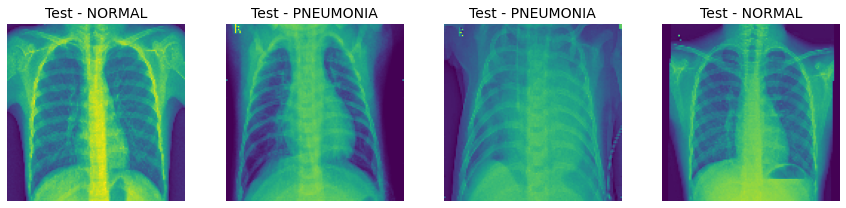

In [35]:
ds = data_test
title = "Test - "
show_images(ds,title)

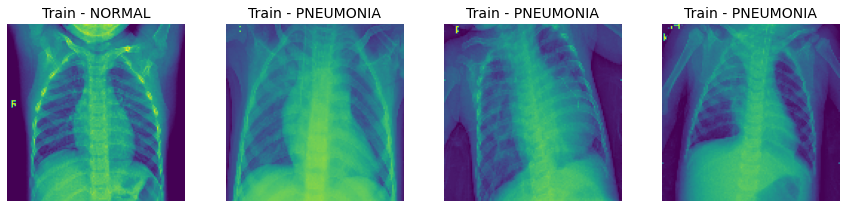

In [36]:
ds = data_train
title = "Train - "
show_images(ds,title)

## Data Preprocessing

### Data Augmentation
Data augmentation is data preprocessing technique to address imbalanced data. With this technique one can increase the diversity of the training set by applying random (but realistic) transformations, such as image rotation.

In [37]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2),
])

In [38]:
# Function to extract features and lables from the dataset
def extract_X_y(ds):
    X=[]
    y=[]
    for image, label in ds.take(len(ds)):
        X.append(image.numpy()) 
        y.append(label.numpy())
    return X,y

In [39]:
# Function to preprocess the data sets
AUTOTUNE = tf.data.AUTOTUNE

def prepare(ds, shuffle=False, augment=False):
  
  if shuffle:
    ds = ds.shuffle(1000)


  # Use data augmentation only on the training set.
  if augment:
    ds = ds.map(lambda x, y: (data_augmentation(x, training=True), y), 
                num_parallel_calls=AUTOTUNE)

  # Use buffered prefetching on all datasets.
  return ds.prefetch(buffer_size=AUTOTUNE)

In [40]:
def check_for_imbalance(ds,ds_desc):
    X,y = extract_X_y(ds)
    X_reshaped  = np.array([item for sublist in X for item in sublist])  # flatten out the list as np array
    y_reshaped  = np.array([item for sublist in y for item in sublist])  # flatten out the list as np array

    df = pd.DataFrame(y_reshaped, columns = ['Label'])
    df.pivot_table(index='Label', aggfunc='size').plot(kind='bar', title = ds_desc+'- Class distribution')

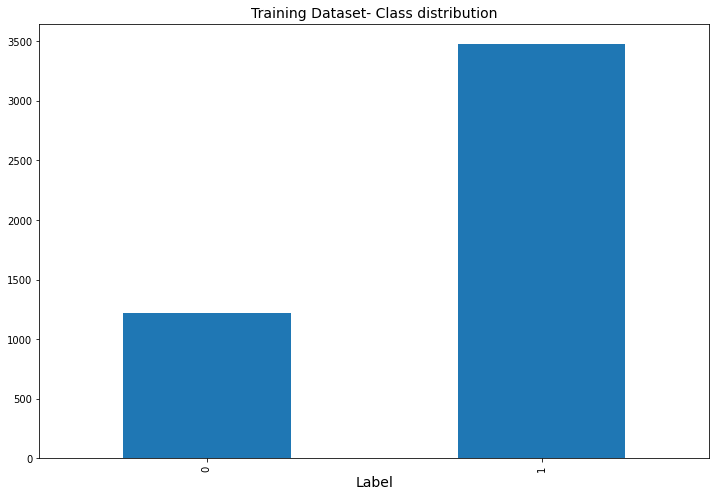

In [41]:
check_for_imbalance(data_train,"Training Dataset")

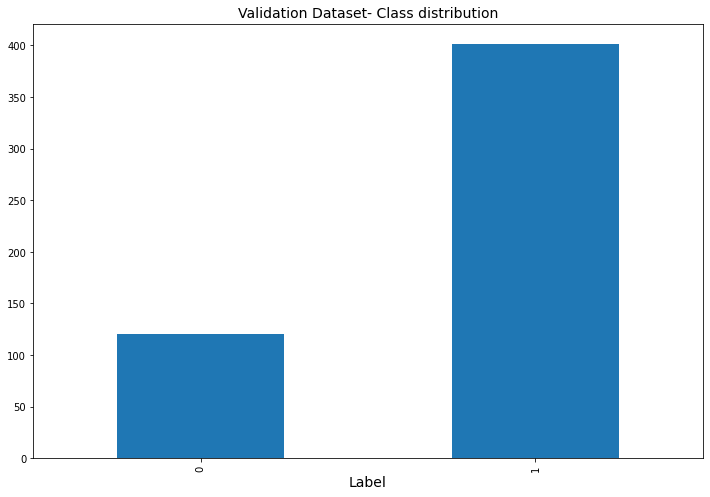

In [42]:
check_for_imbalance(data_val,"Validation Dataset")

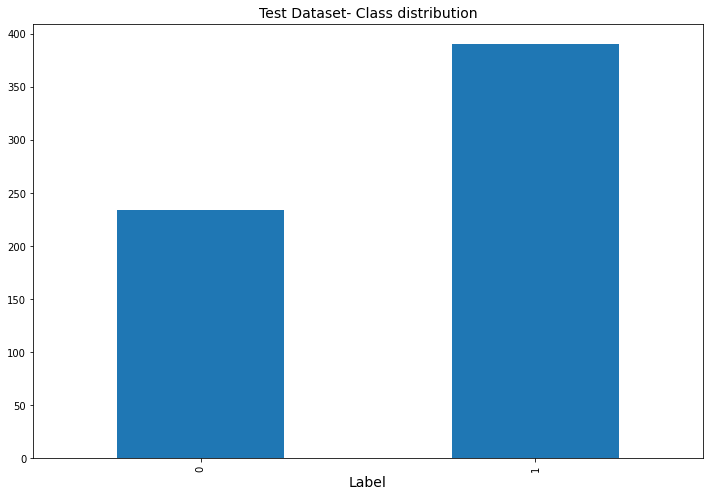

In [43]:
check_for_imbalance(data_test,"Test Dataset")

Conclusion
- In the training and validation data we see lot more sample for images with class 1 - i.e. with penuomonia. The training data is imbalanced and so we need to apply shuffling and data augmentation techniques to eliviate the impacts f imbalanced training data.
This means that we will monitor F1 score when we train the model

# **Part 2:** Define Model and test

## Common Model Testing Functions

In [44]:
epochs=10

### Function to get default optimiser

In [45]:
# Function to get default optimiser
def get_optimizer(lr_schedule=None,optimiser=None):
    if optimiser is None:
        if lr_schedule is None:
            optimiser = tf.keras.optimizers.Adam() # Default optimiser
        else:
            optimiser = tf.keras.optimizers.Adam(lr_schedule)
    return optimiser

### Function to define CNN model with 2 convolution layers

In [46]:
# Function to define CNN model with 2 convolution layers
def define_2_conv_layer_model(filters,filter_size,strides,padding,activation,img_height,img_width,pool_size,kernel_regularizer):
    
  tf.keras.backend.clear_session()

  num_classes = len(class_names)

  model = Sequential([
      # Input layer
      layers.Rescaling(1./255, input_shape=(img_height, img_width, 1)),
      # Convolution Block 1
      layers.Conv2D(filters=filters,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-1',),
      # MaxPooling-1 
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-1',),
      # Convolution Block 2
            layers.Conv2D(filters=filters*2,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-2'),
      # MaxPooling-2
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-2',),
      # Flattening layer
      layers.Flatten(),
      # Dense connected layer
      layers.Dense(300, activation=activation,name="dense_1"),
      # Output layer
      layers.Dense(num_classes,activation="softmax",name="predictions")
    ])
  model.summary()
  return model
  

### Function to define basic CNN model with 3 convolution layers

In [47]:
# Function to define CNN model with 3 convolution layers
def define_3_conv_layer_model(filters,filter_size,strides,padding,activation,img_height,img_width,pool_size,kernel_regularizer):
    
  tf.keras.backend.clear_session()

  num_classes = len(class_names)

  model = Sequential([
      # Input layer
      layers.Rescaling(1./255, input_shape=(img_height, img_width, 1)),

      # Convolution Block 1
      layers.Conv2D(filters=filters,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-1'),
      # MaxPooling-1
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-1',),
      # Convolution Block 2
            layers.Conv2D(filters=filters*2,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-2',),
      # MaxPooling-2
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-2',),
      # Convolution Block 3
            layers.Conv2D(filters=filters*4,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-3',),
      # MaxPooling-3
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-3',),
      # Flattening layer
      layers.Flatten(),
      # Dense connected layer
      layers.Dense(300, activation=activation,name="dense_1"),
      # Output layer
      layers.Dense(num_classes,activation="softmax",name="predictions")
    ])
  model.summary()
  return model

### Function to define CNN model with 3 convolution layers with drop outs

In [48]:
# Function to define CNN model with 3 convolution layers with drop outs
def define_3_conv_layer_model_dropouts(filters,filter_size,strides,padding,activation,img_height,img_width,pool_size,kernel_regularizer,drop_rate):
    
  tf.keras.backend.clear_session()

  num_classes = len(class_names)

  model = Sequential([
    # Input layer
      layers.Rescaling(1./255, input_shape=(img_height, img_width, 1)),
    # Drop out 
      layers.Dropout(drop_rate),
    # Convolution Block 1
      layers.Conv2D(filters=filters,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-1'),
    # Drop out 
        layers.Dropout(drop_rate),
    # MaxPooling-1
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-1',),
    # Convolution Block 2
            layers.Conv2D(filters=filters*2,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-2',),
    # Drop out 
      layers.Dropout(drop_rate),
    # MaxPooling-2
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-2',),
    # Convolution Block 3
            layers.Conv2D(filters=filters*4,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-3',),
    # Drop out 
      layers.Dropout(drop_rate),
    # MaxPooling-3
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-3',),
    # Flattening layer
      layers.Flatten(),
    # Dense connected layer
      layers.Dense(300, activation=activation,name="dense_1"),
    # Drop out 
      layers.Dropout(drop_rate),
    # Output layer
      layers.Dense(num_classes,activation="softmax",name="predictions")
    ])
  model.summary()
  return model

### Funtion to define CNN model with 3 Convolution layers , dropout layers and data augmentation layer

In [49]:
def define_3_conv_layer_model_dropouts_data_aug(filters,filter_size,strides,padding,activation,img_height,img_width,pool_size,kernel_regularizer,drop_rate):
    
  tf.keras.backend.clear_session()

  num_classes = len(class_names)

  model = Sequential([
    # Input layer
      layers.Rescaling(1./255, input_shape=(img_height, img_width, 1)),
    # Data augmentation layer
      layers.RandomFlip("horizontal_and_vertical",seed=200),
      layers.RandomRotation(0.2,seed=200),
    # Drop out 
      layers.Dropout(drop_rate),
    # Convolution Block 1
      layers.Conv2D(filters=filters,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-1'),
    # Drop out 
        layers.Dropout(drop_rate),
    # MaxPooling-1
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-1',),
    # Convolution Block 2
            layers.Conv2D(filters=filters*2,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-2',),
    # Drop out 
      layers.Dropout(drop_rate),
    # MaxPooling-2
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-2',),
    # Convolution Block 3
            layers.Conv2D(filters=filters*4,
                    kernel_size=filter_size,
                    strides=strides,
                    padding=padding,
                    kernel_regularizer=kernel_regularizer,
                    activation=activation,name='Convolution-Layer-3',),
    # Drop out 
      layers.Dropout(drop_rate),
    # MaxPooling-3
      layers.MaxPooling2D(pool_size=pool_size,padding=padding,name='MaxPooling-Layer-3',),
    # Flattening layer
      layers.Flatten(),
    # Dense connected layer
      layers.Dense(300, activation=activation,name="dense_1"),
    # Drop out 
      layers.Dropout(drop_rate),
    # Output layer
      layers.Dense(num_classes,activation="softmax",name="predictions")
    ])
  model.summary()
  return model

### Function to explore model definition

In [50]:
# Function to explore model definition
def model_exploration(model,name):
    tf.keras.utils.plot_model(model, name+"_CNN.png", show_shapes=True)
    print("======== Model Layers ========")
    for layers in range(len(model.layers)):
        layer = model.layers[layers]
        print(layer.name)

### Function to compile the model

In [51]:
# Function to compile the model
def compile_model(model, name,lr_schedule=None,optimizer=None,):
    if optimizer is None:
        optimizer = get_optimizer(lr_schedule)
    model.compile(optimizer=optimizer,
                    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                    metrics=[
                    tf.keras.metrics.SparseCategoricalCrossentropy(
                        from_logits=True, name=name),
                    'accuracy'])
    return model

### Function to train the model

In [52]:
# Function to train the model
def fit_model(model,training_ds,validation_ds,epochs,name): 
    history = model.fit(
        x=training_ds,
        epochs=epochs,
        validation_data=validation_ds,
        shuffle=True,
        use_multiprocessing=True,
        callbacks=get_callbacks(name),
        verbose=1)
    return history

### Function to visualise the results after model training

In [53]:
# Function to visualise the results after model training
def visualise_results(size_histories,model_history_name):
    plotter = tfdocs.plots.HistoryPlotter(metric = 'accuracy', smoothing_std=10)
    plotter.plot(size_histories)
    plt.ylim([0.2, 1])
    save_fig(model_history_name+"_Accuracy")  # extra code
    plt.show()
    
    plotter = tfdocs.plots.HistoryPlotter(metric = 'loss', smoothing_std=10)
    plotter.plot(size_histories)
    plt.ylim([0.01, 1])
    save_fig(model_history_name+"_Loss")  # extra code
    plt.show()
    
    plotter = tfdocs.plots.HistoryPlotter(metric = 'SparseCategoricalCrossentropy', smoothing_std=10)
    plotter.plot(size_histories)
    plt.ylim([0.01, 1])
    save_fig(model_history_name+"_entropy")  # extra code
    plt.show()
    
    pd.DataFrame(size_histories[model_history_name].history).plot(
    figsize=(12, 8), xlim=[0, 9], ylim=[0, 1], grid=True, xlabel="Epoch",
    style=["r--", "r--.", "b-", "b-*"])
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # extra code
    save_fig(model_history_name+"_together")  # extra code
    plt.show()

### Function to Evaluate model performance

In [54]:
# Function to Evaluate model performance
def model_evaluation(model,ds):
    loss,Sparse_CategoricalCrossentropy, accuracy = model.evaluate(ds, verbose=2)
    return loss,accuracy

### Function to do predictions on unseen data

- False negatives and false positives are samples that were incorrectly classified
- True negatives and true positives are samples that were correctly classified
- Accuracy is the percentage of examples correctly classified > 
- Precision is the percentage of predicted positives that were correctly classified > 
- Recall is the percentage of actual positives that were correctly classified 
AUC refers to the Area Under the Curve of a Receiver Operating Characteristic curve (ROC-AUC). This metric is equal to the probability that a classifier will rank a random positive sample higher than a random negative sample.
- AUPRC refers to Area Under the Curve of the Precision-Recall Curve. This metric computes precision-recall pairs for different probability thresholds.

In [55]:
# Function to do predictions on unseen data
def model_predict(model,ds):
    y_proba = model.predict(ds) 
    y_proba.round(2)
    y_predictions = y_proba.argmax(axis=1)
    np.array(class_names)[y_predictions]
    return y_predictions

### Plot the ROC

In [56]:
# plot the ROC
def plot_roc(name, labels, predictions, **kwargs):
    fp, tp, _ = sklearn.metrics.roc_curve(labels, predictions)

    plt.plot(100*fp, 100*tp, label=name, linewidth=2, **kwargs)
    plt.xlabel('False positives [%]')
    plt.ylabel('True positives [%]')
    plt.xlim([-0.5,20])
    plt.ylim([80,100.5])
    plt.grid(True)
    ax = plt.gca()
    ax.set_aspect('equal')

### Function to print confusion matrix

In [57]:
# Function to print confusion matrix
def print_confusion_matrix(model,ds):
    X,y = extract_X_y(ds)
    y_reshaped  = np.array([item for sublist in y for item in sublist])  # flatten out the list as np array
    y_predictions = model_predict(model,ds)
    print(classification_report(y_predictions,y_reshaped))
    confusion_matrix = metrics.confusion_matrix(y_true=y_reshaped, y_pred=y_predictions)  
    auc = roc_auc_score(y_reshaped, y_predictions)
    print(confusion_matrix)
    print("========" )
    print("AUC: " + str(auc))
    fig, ax = plt.subplots(figsize=(7.5, 7.5))
    ax.matshow(confusion_matrix, cmap=plt.cm.Blues, alpha=0.3)
    for i in range(confusion_matrix.shape[0]):
        for j in range(confusion_matrix.shape[1]):
            ax.text(x=j, y=i,s=confusion_matrix[i, j], va='center', ha='center', size='xx-large')
    
    plt.xlabel('Predictions', fontsize=18)
    plt.ylabel('Actuals', fontsize=18)
    plt.title('Confusion Matrix', fontsize=18)
    plt.show()
   
    # plot_roc("Baseline", y_reshaped, y_predictions, color=colors[0])
    # plt.legend(loc='lower right');

### Main function to compile and test the model.

In [58]:
# Main function to compile and test the model.
def test_model(model,name,size_histories,model_history_name,lr_schedule,optimizer):
    
    # Exploring the model
    model_exploration(model,name)
    
    # Compiling model
    name='SparseCategoricalCrossentropy'
    compile_model(model,name,lr_schedule,optimizer)
    
    # Fitting the mode
    history= fit_model(model,data_train,data_val,epochs,name)
    
    # Visulaise the training results
    size_histories[model_history_name] = history
    visualise_results(size_histories,model_history_name)
    
    print("======================================================") 
    # Model evaluation on Test data set 
    test_loss, test_accuracy = model_evaluation(model,data_test)
    print("Accuracy on Test Data is : " + str(test_accuracy))
    # Model evaluation on Train data set 
    train_loss, train_accuracy = model_evaluation(model,data_train)
    print("Accuracy on Train Data is : " + str(train_accuracy))
    print("======================================================")
    
    # Model Predictions on Test data set
    print("===== Classification Report  for Test Data set =====")
    print_confusion_matrix(model,data_test)

    # Model Predictions on Train data set
    print("===== Classification Report  for Train Data set =====")
    print_confusion_matrix(model,data_train)
    
    return history,size_histories

## Benchmarking Models
Generally when building models, we always start from a small basic mode. Here we will first build a simple model with 2 conv layer and then test some of the parameters like best activation function and best optimiser. Once these are identified, we will build a model with 3 conv layers followed by overfitting techniques and hyperparameter tuning

In [59]:
size_histories = {}

### CNN model with 2 Convolution layers
Here we build and test CNN model with 
 - 2 convolution layers
 - ADAM optimiser
 - ReLU Activation function

In [60]:
# Instantiate model instance to test a basic 2 conv layer model
model_2_c= define_2_conv_layer_model( 
                        filters = 16,
                        filter_size = (3,3),
                        strides=(1,1),
                        padding='same',
                        activation='relu',
                        img_height=img_height,
                        img_width=img_width,
                        kernel_regularizer=None,
                        pool_size=(2, 2))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 120, 120, 1)       0         
                                                                 
 Convolution-Layer-1 (Conv2D  (None, 120, 120, 16)     160       
 )                                                               
                                                                 
 MaxPooling-Layer-1 (MaxPool  (None, 60, 60, 16)       0         
 ing2D)                                                          
                                                                 
 Convolution-Layer-2 (Conv2D  (None, 60, 60, 32)       4640      
 )                                                               
                                                                 
 MaxPooling-Layer-2 (MaxPool  (None, 30, 30, 32)       0         
 ing2D)                                                 

======== Model Layers ========
rescaling
Convolution-Layer-1
MaxPooling-Layer-1
Convolution-Layer-2
MaxPooling-Layer-2
flatten
dense_1
predictions
Epoch 1/10
 6/16 [==========>...................] - ETA: 0s - loss: 1.2095 - SparseCategoricalCrossentropy: 1.2095 - accuracy: 0.5389

16/16 [==============================] - ETA: 0s - loss: 0.7892 - SparseCategoricalCrossentropy: 0.7892 - accuracy: 0.6756
Epoch: 0, SparseCategoricalCrossentropy:0.7892,  accuracy:0.6756,  loss:0.7892,  val_SparseCategoricalCrossentropy:0.4414,  val_accuracy:0.7793,  val_loss:0.4414,  
16/16 [==============================] - 16s 276ms/step - loss: 0.7892 - SparseCategoricalCrossentropy: 0.7892 - accuracy: 0.6756 - val_loss: 0.4414 - val_SparseCategoricalCrossentropy: 0.4414 - val_accuracy: 0.7793
Epoch 2/10
16/16 [==============================] - 4s 268ms/step - loss: 0.3231 - SparseCategoricalCrossentropy: 0.3231 - accuracy: 0.8535 - val_loss: 0.1883 - val_SparseCategoricalCrossentropy: 0.1883 - val_accuracy: 0.9098
Epoch 3/10
16/16 [==============================] - 3s 206ms/step - loss: 0.1493 - SparseCategoricalCrossentropy: 0.1493 - accuracy: 0.9412 - val_loss: 0.1022 - val_SparseCategoricalCrossentropy: 0.1022 - val_accuracy: 0.9635
Epoch 4/10
16/16 [==========================

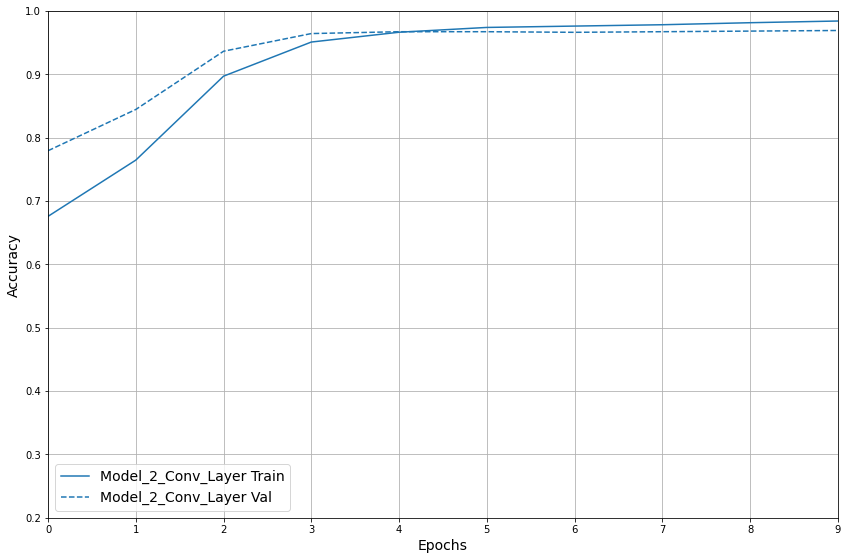

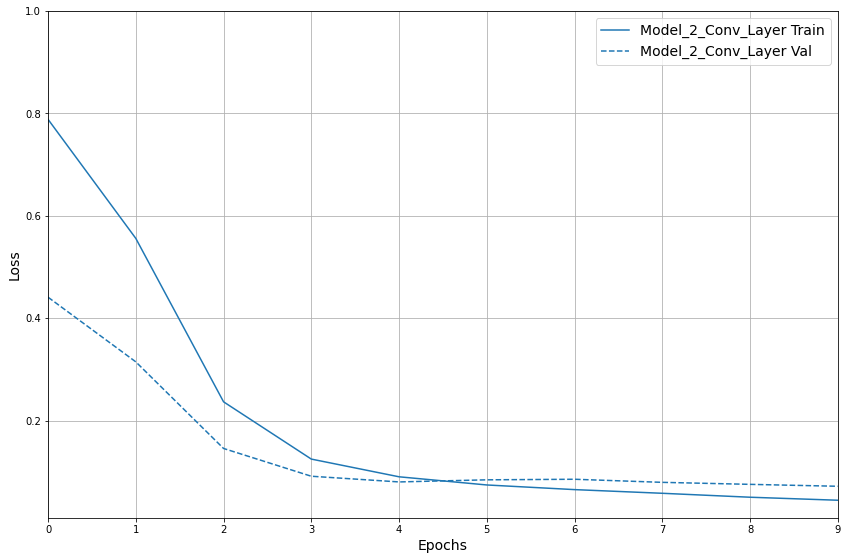

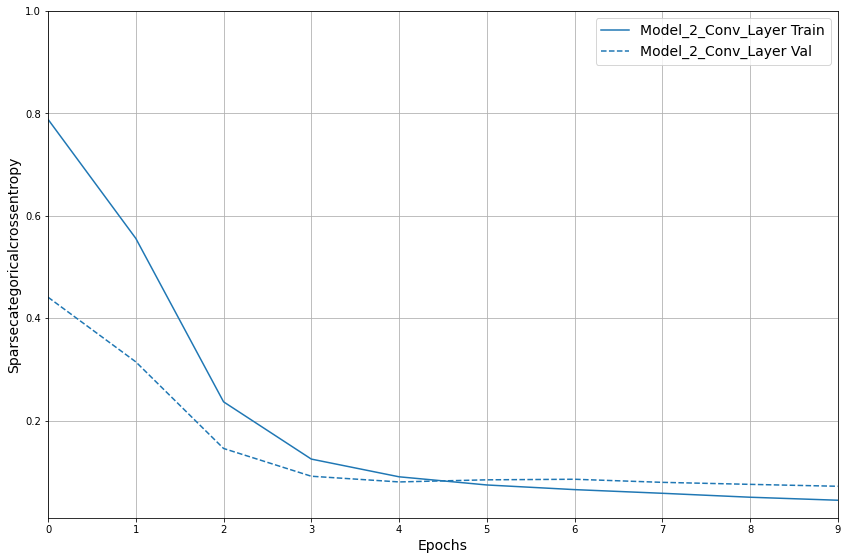

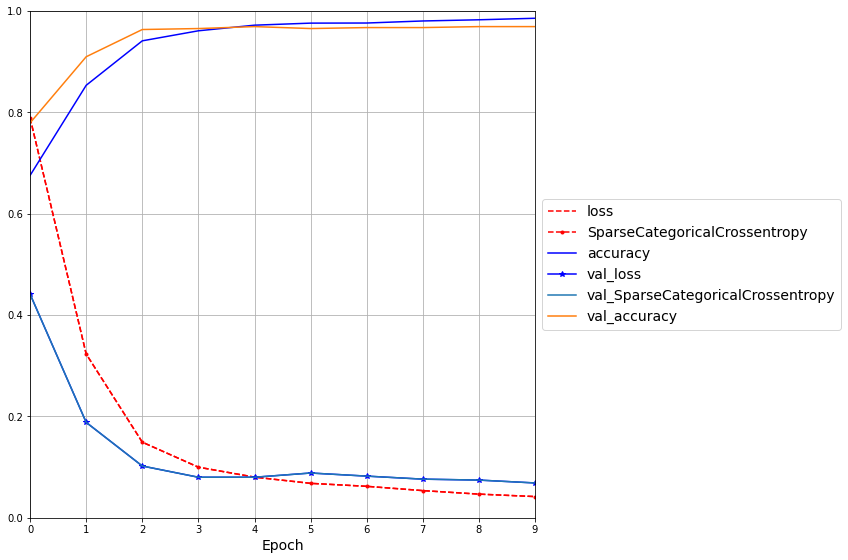

3/3 - 0s - loss: 1.4732 - SparseCategoricalCrossentropy: 1.4732 - accuracy: 0.7163 - 114ms/epoch - 38ms/step
Accuracy on Test Data is : 0.7163461446762085
16/16 - 0s - loss: 0.0506 - SparseCategoricalCrossentropy: 0.0506 - accuracy: 0.9802 - 282ms/epoch - 18ms/step
Accuracy on Train Data is : 0.980191707611084
===== Classification Report  for Test Data set =====
3/3 [==============================] - 0s 11ms/step
              precision    recall  f1-score   support

           0       0.25      0.98      0.40        59
           1       1.00      0.69      0.81       565

    accuracy                           0.72       624
   macro avg       0.62      0.84      0.61       624
weighted avg       0.93      0.72      0.78       624

[[ 58 176]
 [  1 389]]
AUC: 0.6226495726495727


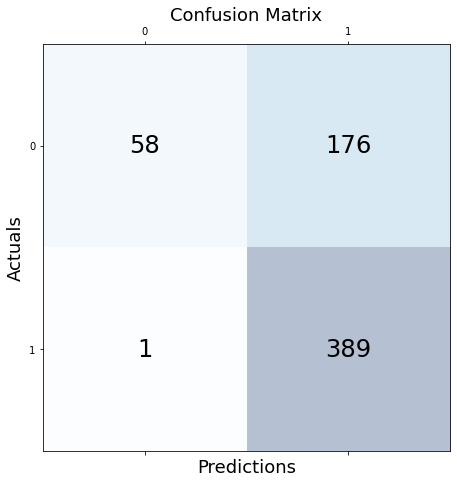

===== Classification Report  for Train Data set =====
16/16 [==============================] - 0s 13ms/step
              precision    recall  f1-score   support

           0       0.93      0.99      0.96      1148
           1       1.00      0.98      0.99      3547

    accuracy                           0.98      4695
   macro avg       0.96      0.98      0.97      4695
weighted avg       0.98      0.98      0.98      4695

[[1138   83]
 [  10 3464]]
AUC: 0.9645722029141719


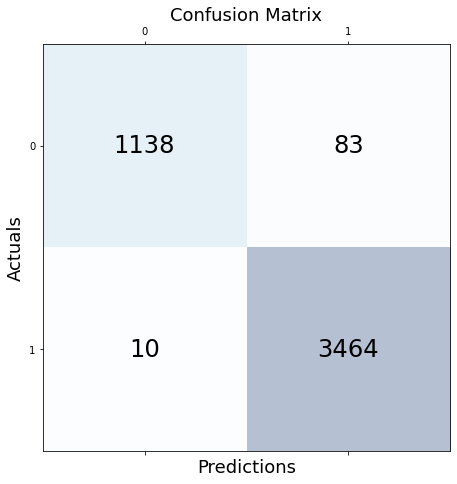

(<keras.callbacks.History at 0x7fba235fb400>,
 {'model_2_conv_layer': <keras.callbacks.History at 0x7fba235fb400>})

In [61]:
# Compile, train and evaluate the model
model_history_name = 'model_2_conv_layer'
lr_schedule = None
optimizer = None # Default optimiser is ADAM
test_model(model_2_c, model_history_name,size_histories,model_history_name,lr_schedule,optimizer)

### CNN model with 2 Conv Layers -  Sigmoid function
Here we build and test CNN model with 
 - 2 convolution layers
 - ADAM optimiser
 - Sigmoid Activation function

* In neural networks, the activation function is a function that is used for the transformation of the input values of neurons. Basically, it introduces the non-linearity into the networks of neural networks so that the networks can learn the relationship between the input and output values.

* ReLu function (activation = activations.relu) – rectified linear unit activation function
  - ReLU is a monotonically increasing Linear Activation function.
  - It is important to note that the ReLU activation function maps negative input values to zero. As a result, a negative preactivation results in a 0 activation. Since the derivative of a constant is a constant, a zero activation results in a gradient of 0.
  - This phenomenon is termed “dead neurons”. Such neurons are essentially useless and may result in suboptimal performance of the network.
  - The problem of “dead neurons” can arise either from large learning rates or from a large negative bias.
  - Using a small learning rate or variations of ReLU (Leaky ReLU, ELU) can help ameliorate the problem of “dead neurons”.
  - More computationally efficient to compute than Sigmoid 

* Sigmoid function(activation = activations.sigmoid) – Sigmoid activation function, sigmoid(x) = 1 / (1 + exp(-x)).
  - Used when we have to predict the probability
  - output is always between 0 and 1
  - Can lead to errors if the data is not normalised as log 0 is undefined.
  - Most common and typically shown with 'S'
* Softmax function(activation = activations.softmax) – softmax converts a vector of value to a probability distribution.

In [62]:
# Instantiate model instance to test a basic 2 conv layer model
model_2_c_Adam_sigmoid= define_2_conv_layer_model( 
                        filters = 16,
                        filter_size = (3,3),
                        strides=(1,1),
                        padding='same',
                        activation='sigmoid',
                        img_height=img_height,
                        img_width=img_width,
                        kernel_regularizer=None,
                        pool_size=(2, 2))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 120, 120, 1)       0         
                                                                 
 Convolution-Layer-1 (Conv2D  (None, 120, 120, 16)     160       
 )                                                               
                                                                 
 MaxPooling-Layer-1 (MaxPool  (None, 60, 60, 16)       0         
 ing2D)                                                          
                                                                 
 Convolution-Layer-2 (Conv2D  (None, 60, 60, 32)       4640      
 )                                                               
                                                                 
 MaxPooling-Layer-2 (MaxPool  (None, 30, 30, 32)       0         
 ing2D)                                                 

======== Model Layers ========
rescaling
Convolution-Layer-1
MaxPooling-Layer-1
Convolution-Layer-2
MaxPooling-Layer-2
flatten
dense_1
predictions
Epoch 1/10
 6/16 [==========>...................] - ETA: 0s - loss: 7.9174 - SparseCategoricalCrossentropy: 7.9174 - accuracy: 0.3517

16/16 [==============================] - ETA: 0s - loss: 8.1026 - SparseCategoricalCrossentropy: 8.1026 - accuracy: 0.2873
Epoch: 0, SparseCategoricalCrossentropy:8.1026,  accuracy:0.2873,  loss:8.1026,  val_SparseCategoricalCrossentropy:7.1055,  val_accuracy:0.2303,  val_loss:7.1055,  
16/16 [==============================] - 7s 282ms/step - loss: 8.1026 - SparseCategoricalCrossentropy: 8.1026 - accuracy: 0.2873 - val_loss: 7.1055 - val_SparseCategoricalCrossentropy: 7.1055 - val_accuracy: 0.2303
Epoch 2/10
16/16 [==============================] - 4s 229ms/step - loss: 5.1748 - SparseCategoricalCrossentropy: 5.1748 - accuracy: 0.2601 - val_loss: 3.4035 - val_SparseCategoricalCrossentropy: 3.4035 - val_accuracy: 0.2303
Epoch 3/10
16/16 [==============================] - 3s 221ms/step - loss: 1.8200 - SparseCategoricalCrossentropy: 1.8200 - accuracy: 0.2601 - val_loss: 0.6573 - val_SparseCategoricalCrossentropy: 0.6573 - val_accuracy: 0.7697
Epoch 4/10
16/16 [===========================

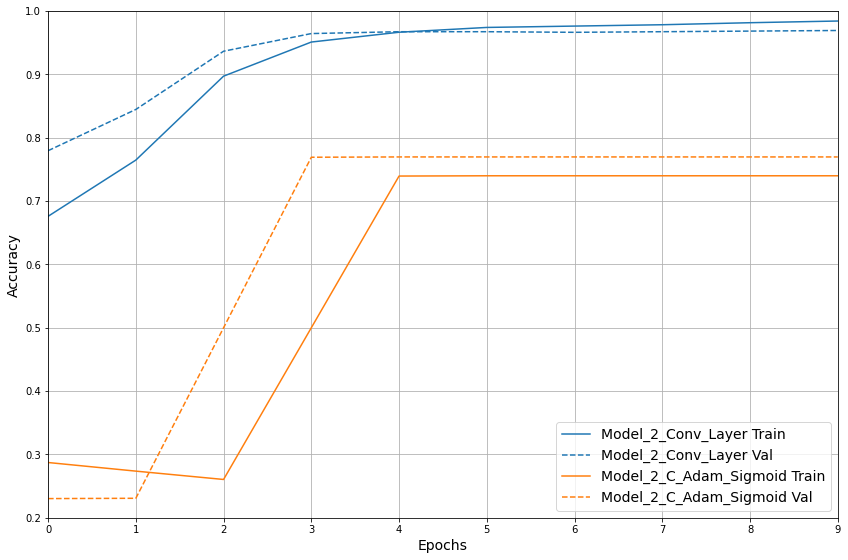

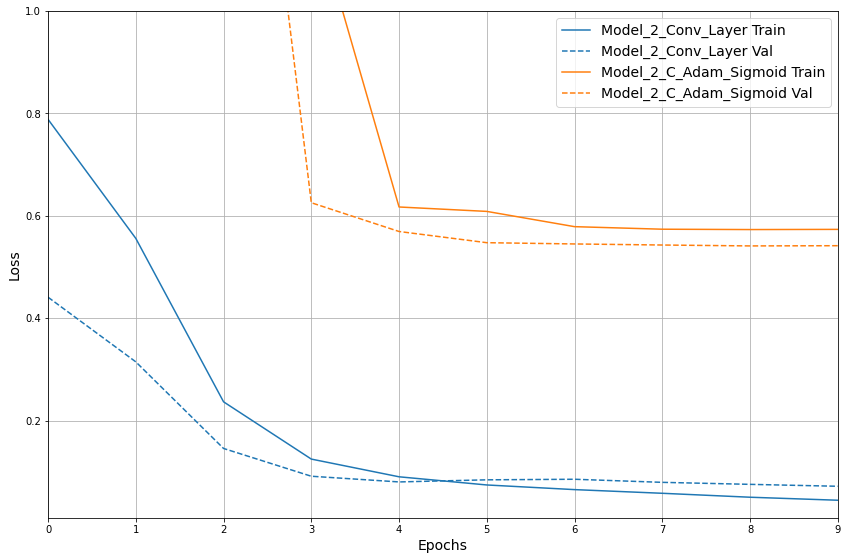

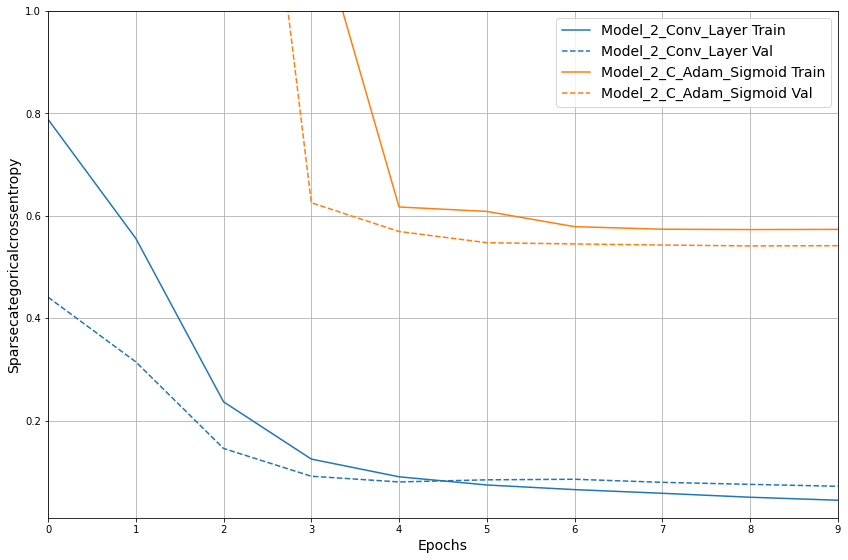

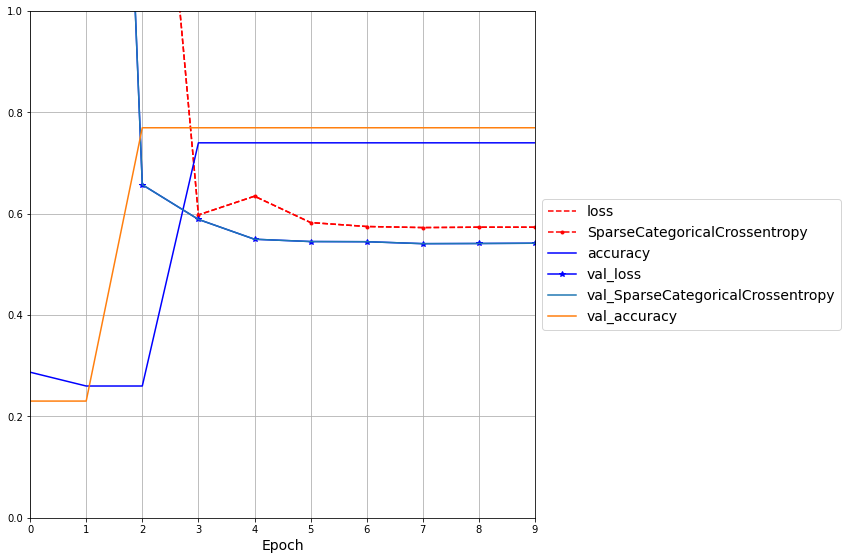

3/3 - 0s - loss: 0.6941 - SparseCategoricalCrossentropy: 0.6941 - accuracy: 0.6250 - 123ms/epoch - 41ms/step
Accuracy on Test Data is : 0.625
16/16 - 0s - loss: 0.5731 - SparseCategoricalCrossentropy: 0.5731 - accuracy: 0.7399 - 354ms/epoch - 22ms/step
Accuracy on Train Data is : 0.739936113357544
===== Classification Report  for Test Data set =====
3/3 [==============================] - 0s 16ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.62      0.77       624

    accuracy                           0.62       624
   macro avg       0.50      0.31      0.38       624
weighted avg       1.00      0.62      0.77       624

[[  0 234]
 [  0 390]]
AUC: 0.5


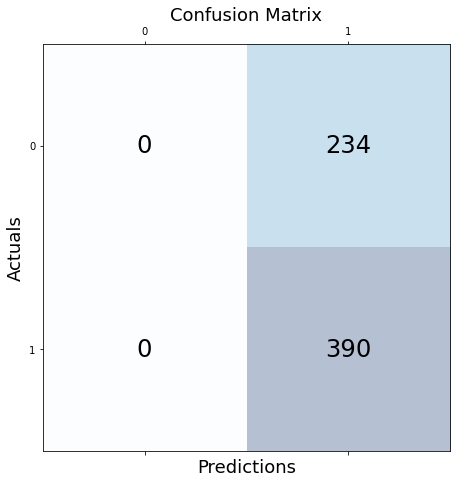

===== Classification Report  for Train Data set =====
16/16 [==============================] - 0s 19ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.74      0.85      4695

    accuracy                           0.74      4695
   macro avg       0.50      0.37      0.43      4695
weighted avg       1.00      0.74      0.85      4695

[[   0 1221]
 [   0 3474]]
AUC: 0.5


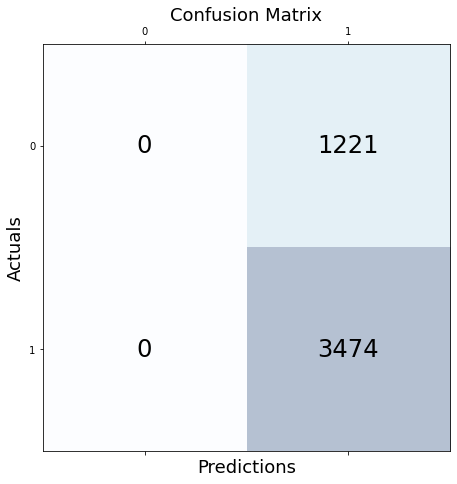

(<keras.callbacks.History at 0x7fba2323faf0>,
 {'model_2_conv_layer': <keras.callbacks.History at 0x7fba235fb400>,
  'model_2_c_Adam_sigmoid': <keras.callbacks.History at 0x7fba2323faf0>})

In [63]:
# Compile, train and evaluate the model
model_history_name = 'model_2_c_Adam_sigmoid'
lr_schedule = None
optimizer = None # Default optimiser is ADAM
test_model(model_2_c_Adam_sigmoid, model_history_name,size_histories,model_history_name,lr_schedule,optimizer)

**Conclusion**
- Relu activation function gives better result than sigmoid in terms of accuracy
- Sigmoid function is not able to classify the images are AUC is 0.5
- We will only use ReLU activation function for the rest of the testing

### CNN model with 2 Convolution layers and RMSprop
Here we build and test CNN model with 
 - 2 convolution layers
 - RMSprop optimiser
 - ReLU Activation function

The RMSprop optimizer restricts the oscillations in the vertical direction. Therefore, we can increase our learning rate and our algorithm could take larger steps in the horizontal direction converging faster

The gist of RMSprop is to:

Maintain a moving (discounted) average of the square of gradients
Divide the gradient by the root of this average

In [65]:
# Instantiate model instance to test a basic 2 conv layer model
model_2_c_RMSprop= define_2_conv_layer_model( 
                        filters = 16,
                        filter_size = (3,3),
                        strides=(1,1),
                        padding='same',
                        activation='relu',
                        img_height=img_height,
                        img_width=img_width,
                        kernel_regularizer=None,
                        pool_size=(2, 2))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 120, 120, 1)       0         
                                                                 
 Convolution-Layer-1 (Conv2D  (None, 120, 120, 16)     160       
 )                                                               
                                                                 
 MaxPooling-Layer-1 (MaxPool  (None, 60, 60, 16)       0         
 ing2D)                                                          
                                                                 
 Convolution-Layer-2 (Conv2D  (None, 60, 60, 32)       4640      
 )                                                               
                                                                 
 MaxPooling-Layer-2 (MaxPool  (None, 30, 30, 32)       0         
 ing2D)                                                 

======== Model Layers ========
rescaling
Convolution-Layer-1
MaxPooling-Layer-1
Convolution-Layer-2
MaxPooling-Layer-2
flatten
dense_1
predictions
Epoch 1/10
 6/16 [==========>...................] - ETA: 0s - loss: 1.4240 - SparseCategoricalCrossentropy: 1.4240 - accuracy: 0.6661

15/16 [===========================>..] - ETA: 0s - loss: 0.9070 - SparseCategoricalCrossentropy: 0.9070 - accuracy: 0.6847
Epoch: 0, SparseCategoricalCrossentropy:0.8911,  accuracy:0.6927,  loss:0.8911,  val_SparseCategoricalCrossentropy:0.5221,  val_accuracy:0.7697,  val_loss:0.5221,  
16/16 [==============================] - 5s 229ms/step - loss: 0.8911 - SparseCategoricalCrossentropy: 0.8911 - accuracy: 0.6927 - val_loss: 0.5221 - val_SparseCategoricalCrossentropy: 0.5221 - val_accuracy: 0.7697
Epoch 2/10
16/16 [==============================] - 4s 250ms/step - loss: 0.4737 - SparseCategoricalCrossentropy: 0.4737 - accuracy: 0.7666 - val_loss: 0.4236 - val_SparseCategoricalCrossentropy: 0.4236 - val_accuracy: 0.7812
Epoch 3/10
16/16 [==============================] - 3s 202ms/step - loss: 0.3451 - SparseCategoricalCrossentropy: 0.3451 - accuracy: 0.8577 - val_loss: 0.2209 - val_SparseCategoricalCrossentropy: 0.2209 - val_accuracy: 0.9079
Epoch 4/10
16/16 [===========================

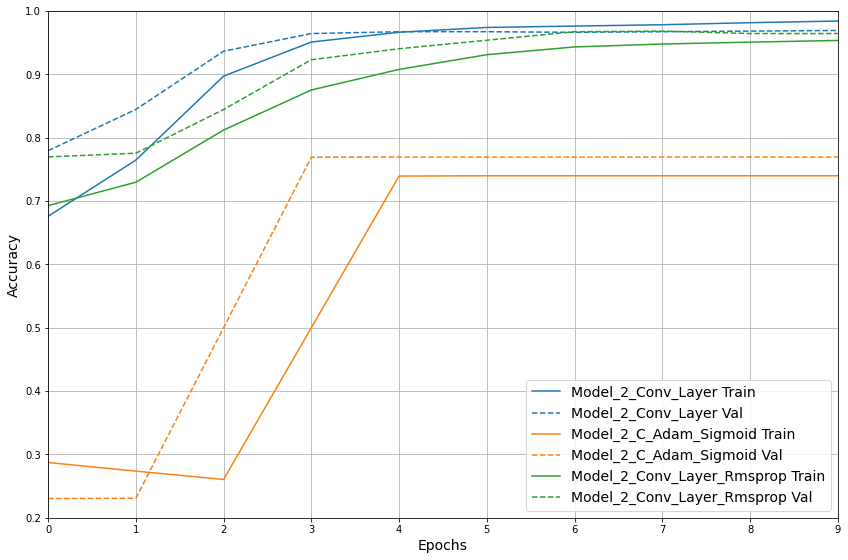

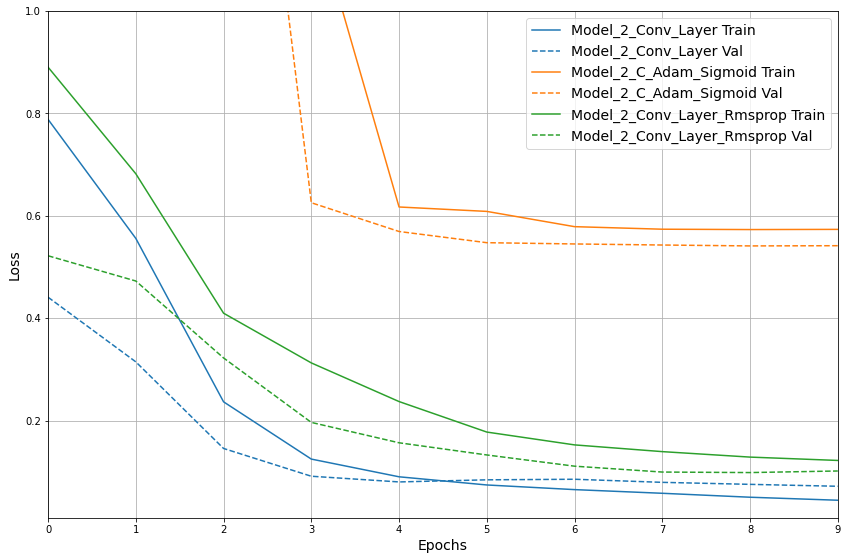

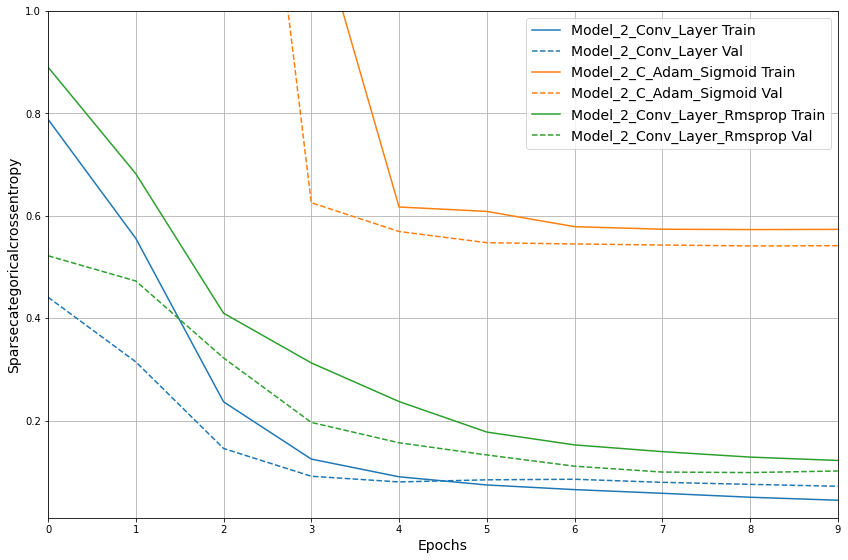

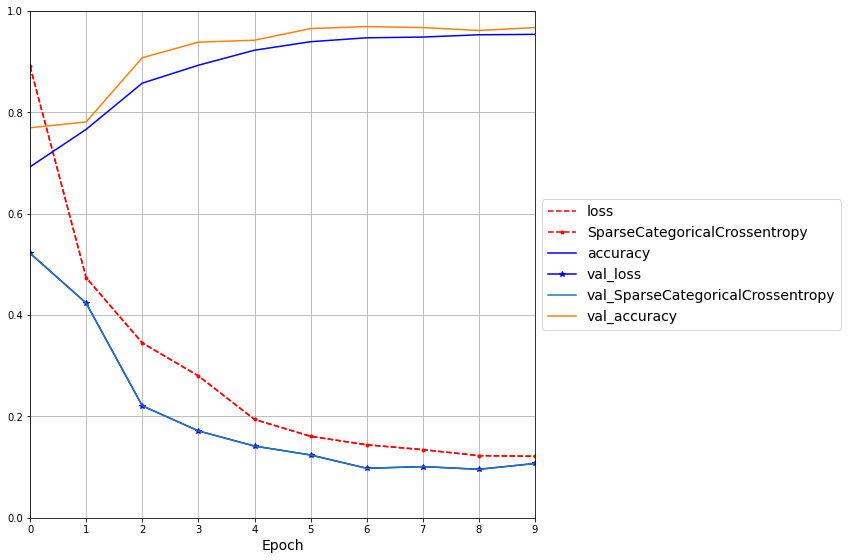

3/3 - 0s - loss: 0.7167 - SparseCategoricalCrossentropy: 0.7167 - accuracy: 0.7404 - 56ms/epoch - 19ms/step
Accuracy on Test Data is : 0.7403846383094788
16/16 - 0s - loss: 0.0978 - SparseCategoricalCrossentropy: 0.0978 - accuracy: 0.9685 - 288ms/epoch - 18ms/step
Accuracy on Train Data is : 0.9684771299362183
===== Classification Report  for Test Data set =====
3/3 [==============================] - 0s 13ms/step
              precision    recall  f1-score   support

           0       0.32      0.95      0.48        80
           1       0.99      0.71      0.83       544

    accuracy                           0.74       624
   macro avg       0.66      0.83      0.66       624
weighted avg       0.90      0.74      0.78       624

[[ 76 158]
 [  4 386]]
AUC: 0.6572649572649573


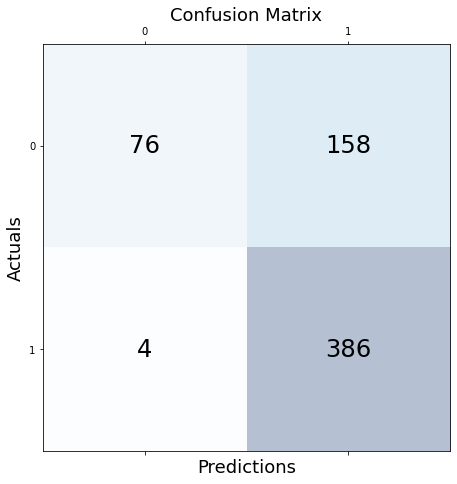

===== Classification Report  for Train Data set =====
16/16 [==============================] - 0s 14ms/step
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      1189
           1       0.98      0.97      0.98      3506

    accuracy                           0.97      4695
   macro avg       0.95      0.96      0.96      4695
weighted avg       0.97      0.97      0.97      4695

[[1131   90]
 [  58 3416]]
AUC: 0.9547972371806567


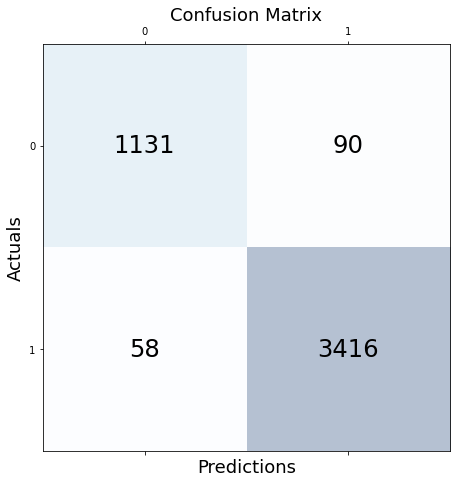

(<keras.callbacks.History at 0x7fba22343100>,
 {'model_2_conv_layer': <keras.callbacks.History at 0x7fba235fb400>,
  'model_2_c_Adam_sigmoid': <keras.callbacks.History at 0x7fba2323faf0>,
  'model_2_conv_layer_RMSprop': <keras.callbacks.History at 0x7fba22343100>})

In [66]:
# Compile, train and evaluate the model
model_history_name = 'model_2_conv_layer_RMSprop'
lr_schedule = None
optimizer = 'RMSprop' # Default optimiser is ADAM
test_model(model_2_c_RMSprop, model_history_name,size_histories,model_history_name,lr_schedule,optimizer)

**Conclusion**
- RMSprop optimiser provides better result compared to Adam in terms of accuracy and classification


We will take this model as base and try to test the effect of adding additional convolution layer.

###  CNN model with 3 Convolution layers - RMSprop
Here we build and test CNN model with 
 - 3 convolution layers
 - RMSprop optimiser
 - ReLU Activation function

In [69]:
# Instantiate model instance
model_3_c_RMSprop= define_3_conv_layer_model( 
                        filters = 16,
                        filter_size = (3,3),
                        strides=(1,1),
                        padding='same',
                        activation='relu',
                        img_height=img_height,
                        img_width=img_width,
                        kernel_regularizer=None,
                        pool_size=(2, 2))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 120, 120, 1)       0         
                                                                 
 Convolution-Layer-1 (Conv2D  (None, 120, 120, 16)     160       
 )                                                               
                                                                 
 MaxPooling-Layer-1 (MaxPool  (None, 60, 60, 16)       0         
 ing2D)                                                          
                                                                 
 Convolution-Layer-2 (Conv2D  (None, 60, 60, 32)       4640      
 )                                                               
                                                                 
 MaxPooling-Layer-2 (MaxPool  (None, 30, 30, 32)       0         
 ing2D)                                                 

======== Model Layers ========
rescaling
Convolution-Layer-1
MaxPooling-Layer-1
Convolution-Layer-2
MaxPooling-Layer-2
Convolution-Layer-3
MaxPooling-Layer-3
flatten
dense_1
predictions
Epoch 1/10
 6/16 [==========>...................] - ETA: 0s - loss: 1.5663 - SparseCategoricalCrossentropy: 1.5663 - accuracy: 0.6361

15/16 [===========================>..] - ETA: 0s - loss: 0.9566 - SparseCategoricalCrossentropy: 0.9566 - accuracy: 0.7047
Epoch: 0, SparseCategoricalCrossentropy:0.9379,  accuracy:0.7080,  loss:0.9379,  val_SparseCategoricalCrossentropy:0.6025,  val_accuracy:0.7697,  val_loss:0.6025,  
16/16 [==============================] - 5s 180ms/step - loss: 0.9379 - SparseCategoricalCrossentropy: 0.9379 - accuracy: 0.7080 - val_loss: 0.6025 - val_SparseCategoricalCrossentropy: 0.6025 - val_accuracy: 0.7697
Epoch 2/10
16/16 [==============================] - 2s 129ms/step - loss: 0.5326 - SparseCategoricalCrossentropy: 0.5326 - accuracy: 0.7749 - val_loss: 0.3663 - val_SparseCategoricalCrossentropy: 0.3663 - val_accuracy: 0.8829
Epoch 3/10
16/16 [==============================] - 2s 133ms/step - loss: 0.3876 - SparseCategoricalCrossentropy: 0.3876 - accuracy: 0.8388 - val_loss: 0.2739 - val_SparseCategoricalCrossentropy: 0.2739 - val_accuracy: 0.8810
Epoch 4/10
16/16 [===========================

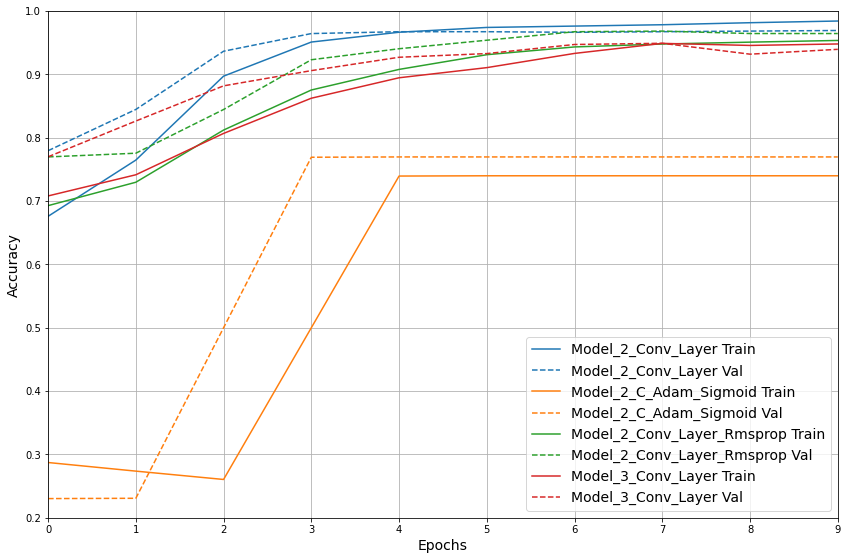

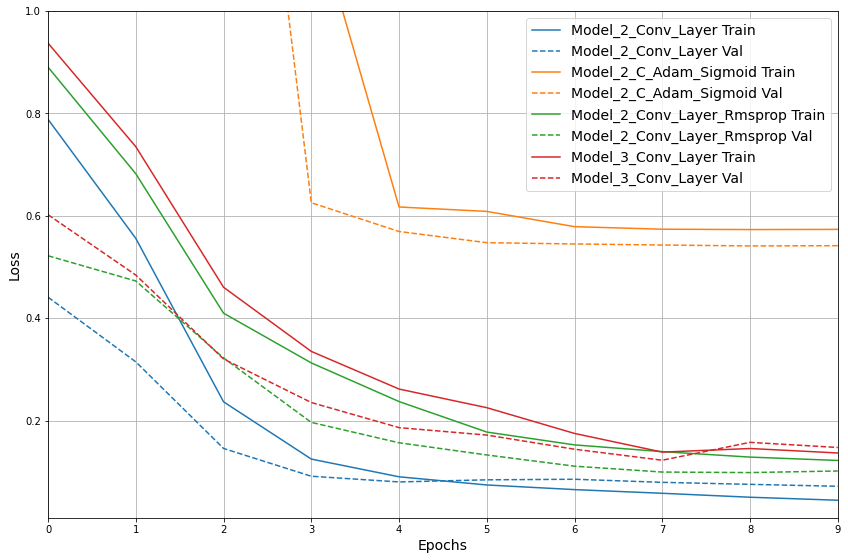

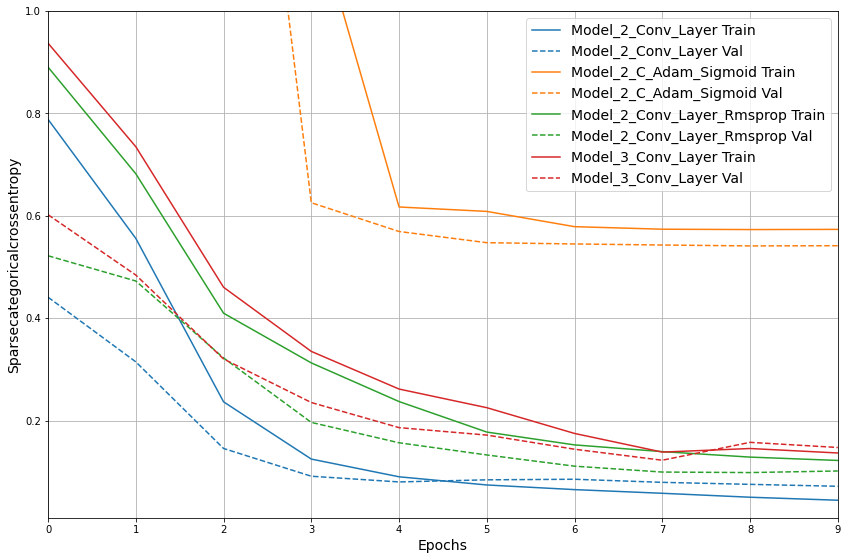

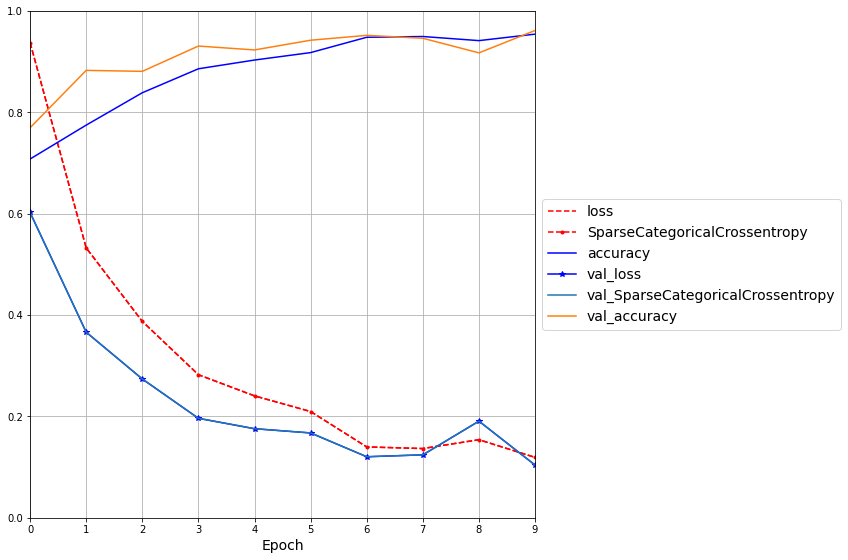

3/3 - 0s - loss: 0.8507 - SparseCategoricalCrossentropy: 0.8507 - accuracy: 0.7244 - 69ms/epoch - 23ms/step
Accuracy on Test Data is : 0.7243589758872986
16/16 - 0s - loss: 0.1171 - SparseCategoricalCrossentropy: 0.1171 - accuracy: 0.9546 - 351ms/epoch - 22ms/step
Accuracy on Train Data is : 0.954632580280304
===== Classification Report  for Test Data set =====
3/3 [==============================] - 0s 18ms/step
              precision    recall  f1-score   support

           0       0.27      0.98      0.42        64
           1       1.00      0.69      0.82       560

    accuracy                           0.72       624
   macro avg       0.63      0.84      0.62       624
weighted avg       0.92      0.72      0.78       624

[[ 63 171]
 [  1 389]]
AUC: 0.6333333333333333


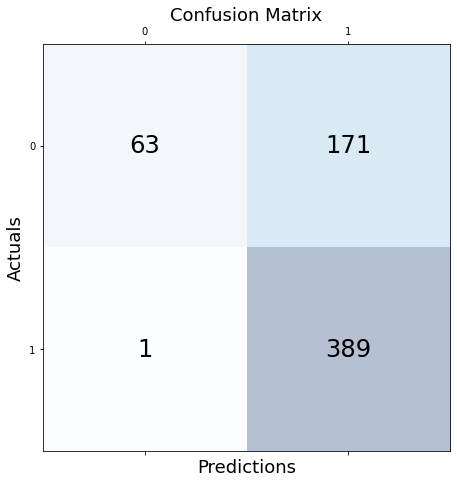

===== Classification Report  for Train Data set =====
16/16 [==============================] - 0s 16ms/step
              precision    recall  f1-score   support

           0       0.85      0.97      0.91      1078
           1       0.99      0.95      0.97      3617

    accuracy                           0.95      4695
   macro avg       0.92      0.96      0.94      4695
weighted avg       0.96      0.95      0.96      4695

[[1043  178]
 [  35 3439]]
AUC: 0.9220715062683974


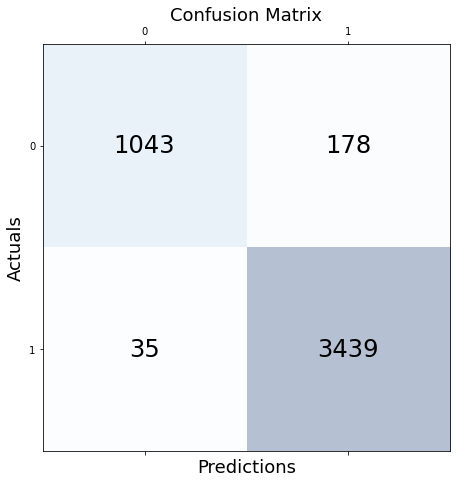

(<keras.callbacks.History at 0x7fba8c8e9760>,
 {'model_2_conv_layer': <keras.callbacks.History at 0x7fba235fb400>,
  'model_2_c_Adam_sigmoid': <keras.callbacks.History at 0x7fba2323faf0>,
  'model_2_conv_layer_RMSprop': <keras.callbacks.History at 0x7fba22343100>,
  'model_3_conv_layer': <keras.callbacks.History at 0x7fba8c8e9760>})

In [70]:
# Compile, train and evaluate the model
model_history_name = 'model_3_conv_layer'
lr_schedule=None
optimizer = 'RMSprop' # Default optimiser is ADAM
test_model(model_3_c_RMSprop, model_history_name,size_histories,model_history_name,lr_schedule,optimizer)

**Conclusion**
- AUC represents the degree or measure of separability. Higher the AUC, the better the model is at predicting 0 classes as 0 and 1 classes as 1.
- CNN with 3 convolution  layer has more accuracy.  We will use this model as our base model to further do hyper parameter tunning.
- Accuracy on training dataset is far higher than validation and test dataset.This means the model overfits on the training dataset.


### Addressing Overfitting
This gap between training accuracy and test accuracy represents overfitting. Overfitting happens when a machine learning model performs worse on new, previously unseen inputs than it does on the training data. An overfitted model "memorizes" the noise and details in the training dataset to a point where it negatively impacts the performance of the model on the new data. 

Overfitting generally occurs when there are a small number of training examples. Data augmentation takes the approach of generating additional training data from your existing examples by augmenting them using random transformations that yield believable-looking images. This helps expose the model to more aspects of the data and generalize better.

If the performance of the model on the training dataset is significantly better than the performance on the test dataset, then the model may have overfit the training dataset.

There are multiple strategies to address overfitting models as below -
1. Add weight regularization - L1 /L2 Regularization
2. Add dropouts at all layers
3. Data augmentation
4. Batch normalisation

Each method can help on its own, but often combining them can be even more effective.

#### **Weight Regularisation  - L2**
L1 regularization, where the cost added is proportional to the absolute value of the weights coefficients (i.e. to what is called the "L1 norm" of the weights).

L2 regularization, where the cost added is proportional to the square of the value of the weights coefficients (i.e. to what is called the squared "L2 norm" of the weights). L2 regularization is also called weight decay in the context of neural networks. Don't let the different name confuse you: weight decay is mathematically the exact same as L2 regularization.

L1 regularization pushes weights towards exactly zero, encouraging a sparse model. L2 regularization will penalize the weights parameters without making them sparse since the penalty goes to zero for small weights—one reason why L2 is more common.

In [71]:
# Instantiate model instance
model_3_c_L2_reg= define_3_conv_layer_model( 
                        filters = 16,
                        filter_size = (3,3),
                        strides=(1,1),
                        padding='same',
                        activation='relu',
                        img_height=img_height,
                        img_width=img_width,
                        kernel_regularizer=regularizers.l2(0.01),
                        pool_size=(2, 2))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 120, 120, 1)       0         
                                                                 
 Convolution-Layer-1 (Conv2D  (None, 120, 120, 16)     160       
 )                                                               
                                                                 
 MaxPooling-Layer-1 (MaxPool  (None, 60, 60, 16)       0         
 ing2D)                                                          
                                                                 
 Convolution-Layer-2 (Conv2D  (None, 60, 60, 32)       4640      
 )                                                               
                                                                 
 MaxPooling-Layer-2 (MaxPool  (None, 30, 30, 32)       0         
 ing2D)                                                 

======== Model Layers ========
rescaling
Convolution-Layer-1
MaxPooling-Layer-1
Convolution-Layer-2
MaxPooling-Layer-2
Convolution-Layer-3
MaxPooling-Layer-3
flatten
dense_1
predictions
Epoch 1/10
 6/16 [==========>...................] - ETA: 0s - loss: 1.3937 - SparseCategoricalCrossentropy: 0.8028 - accuracy: 0.5650

15/16 [===========================>..] - ETA: 0s - loss: 1.1884 - SparseCategoricalCrossentropy: 0.6673 - accuracy: 0.6762
Epoch: 0, SparseCategoricalCrossentropy:0.6643,  accuracy:0.6807,  loss:1.1812,  val_SparseCategoricalCrossentropy:0.5247,  val_accuracy:0.7697,  val_loss:0.9377,  
16/16 [==============================] - 4s 151ms/step - loss: 1.1812 - SparseCategoricalCrossentropy: 0.6643 - accuracy: 0.6807 - val_loss: 0.9377 - val_SparseCategoricalCrossentropy: 0.5247 - val_accuracy: 0.7697
Epoch 2/10
16/16 [==============================] - 2s 132ms/step - loss: 0.8686 - SparseCategoricalCrossentropy: 0.5060 - accuracy: 0.7331 - val_loss: 0.6791 - val_SparseCategoricalCrossentropy: 0.3638 - val_accuracy: 0.8714
Epoch 3/10
16/16 [==============================] - 2s 131ms/step - loss: 0.7268 - SparseCategoricalCrossentropy: 0.4366 - accuracy: 0.7981 - val_loss: 0.5900 - val_SparseCategoricalCrossentropy: 0.3243 - val_accuracy: 0.8791
Epoch 4/10
16/16 [===========================

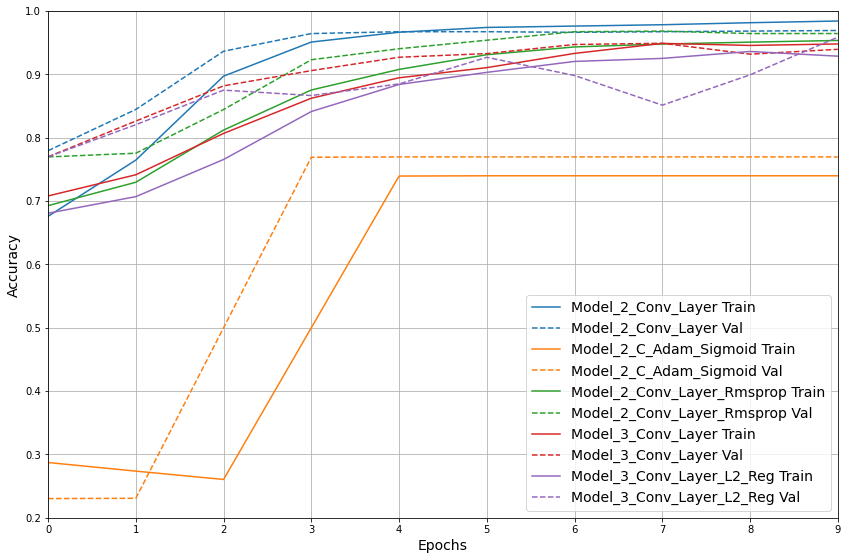

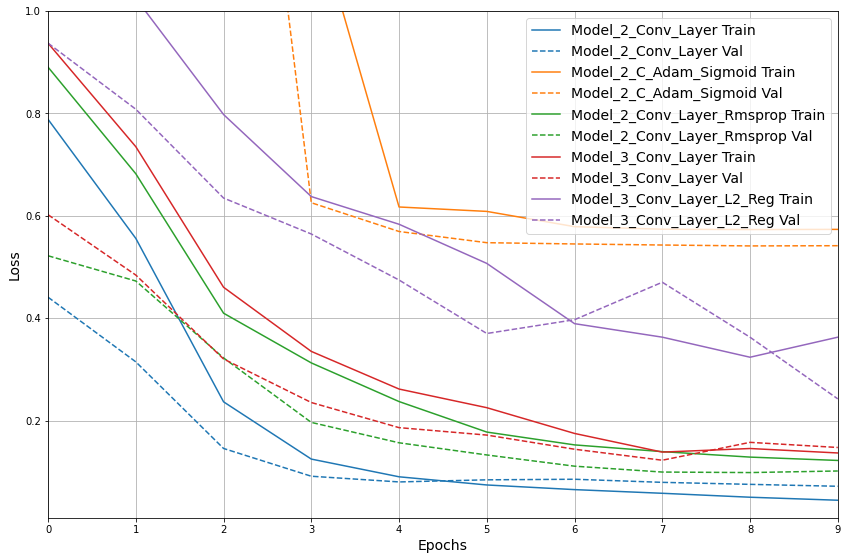

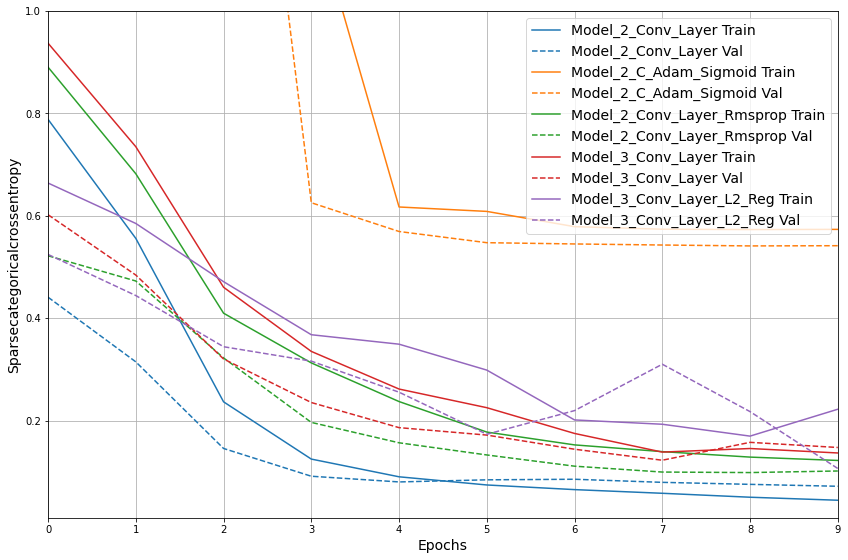

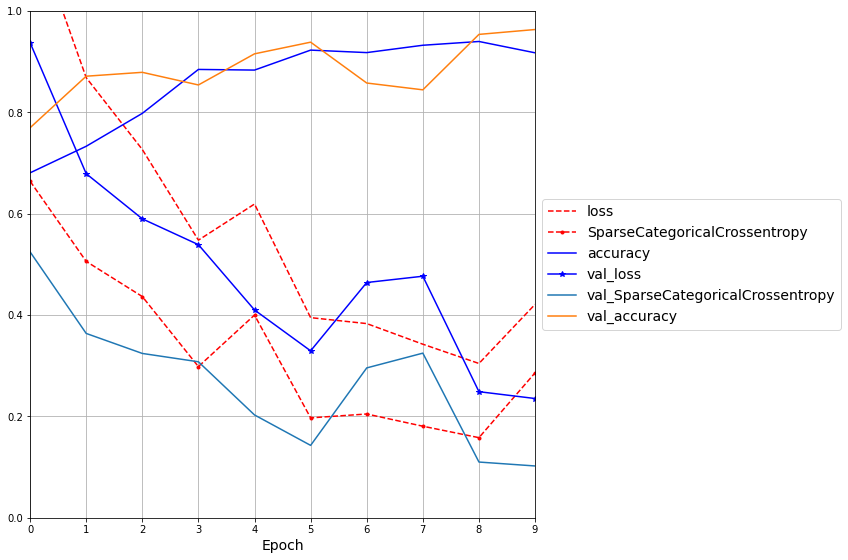

3/3 - 0s - loss: 0.8273 - SparseCategoricalCrossentropy: 0.6942 - accuracy: 0.7340 - 67ms/epoch - 22ms/step
Accuracy on Test Data is : 0.7339743375778198
16/16 - 0s - loss: 0.2543 - SparseCategoricalCrossentropy: 0.1212 - accuracy: 0.9534 - 308ms/epoch - 19ms/step
Accuracy on Train Data is : 0.9533546566963196
===== Classification Report  for Test Data set =====
3/3 [==============================] - 0s 13ms/step
              precision    recall  f1-score   support

           0       0.29      0.99      0.45        70
           1       1.00      0.70      0.82       554

    accuracy                           0.73       624
   macro avg       0.65      0.84      0.64       624
weighted avg       0.92      0.73      0.78       624

[[ 69 165]
 [  1 389]]
AUC: 0.6461538461538461


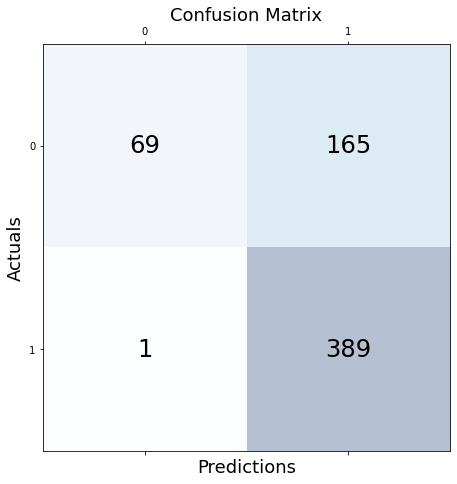

===== Classification Report  for Train Data set =====
16/16 [==============================] - 0s 15ms/step
              precision    recall  f1-score   support

           0       0.86      0.96      0.91      1086
           1       0.99      0.95      0.97      3609

    accuracy                           0.95      4695
   macro avg       0.92      0.96      0.94      4695
weighted avg       0.96      0.95      0.95      4695

[[1044  177]
 [  42 3432]]
AUC: 0.921473522509792


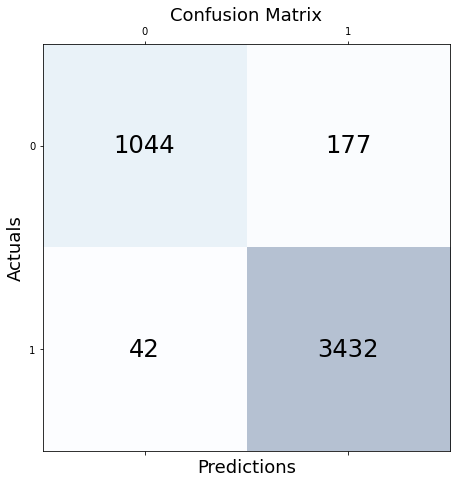

(<keras.callbacks.History at 0x7fba8c6c7100>,
 {'model_2_conv_layer': <keras.callbacks.History at 0x7fba235fb400>,
  'model_2_c_Adam_sigmoid': <keras.callbacks.History at 0x7fba2323faf0>,
  'model_2_conv_layer_RMSprop': <keras.callbacks.History at 0x7fba22343100>,
  'model_3_conv_layer': <keras.callbacks.History at 0x7fba8c8e9760>,
  'model_3_conv_layer_L2_reg': <keras.callbacks.History at 0x7fba8c6c7100>})

In [72]:
# Compile, train and evaluate the model
model_history_name = 'model_3_conv_layer_L2_reg'
lr_schedule=None
optimizer = 'RMSprop' # Default optimiser is ADAM
test_model(model_3_c_L2_reg, model_history_name,size_histories,model_history_name,lr_schedule,optimizer)

**Conclusion**
- Model accuracy on test data set has marginally improved. However, AUC has increased which indicates model is more generalised compared to model without any weight regulaisation.
- Model is able to classify Pneumonia images more accurately than images of normal lungs
- if number of Epochs was increased the  Accuracy of training data set would decrease. Due to limitation of hardware this has not been implemented.

#### **Dropouts**
Here,we will define a CNN model with
- 3 Convolution lyers and maxpooling layers
- dropout layer with drop rate of 30% at input and all output layers

In [73]:
# Instantiate model instance
model_3_c_L2_dropout = define_3_conv_layer_model_dropouts( 
                        filters = 16,
                        filter_size = (3,3),
                        strides=(1,1),
                        padding='same',
                        activation='relu',
                        img_height=img_height,
                        img_width=img_width,
                        kernel_regularizer=regularizers.l2(0.01),
                        pool_size=(2, 2),
                        drop_rate=0.2
                        )

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 120, 120, 1)       0         
                                                                 
 dropout (Dropout)           (None, 120, 120, 1)       0         
                                                                 
 Convolution-Layer-1 (Conv2D  (None, 120, 120, 16)     160       
 )                                                               
                                                                 
 dropout_1 (Dropout)         (None, 120, 120, 16)      0         
                                                                 
 MaxPooling-Layer-1 (MaxPool  (None, 60, 60, 16)       0         
 ing2D)                                                          
                                                                 
 Convolution-Layer-2 (Conv2D  (None, 60, 60, 32)       4

======== Model Layers ========
rescaling
dropout
Convolution-Layer-1
dropout_1
MaxPooling-Layer-1
Convolution-Layer-2
dropout_2
MaxPooling-Layer-2
Convolution-Layer-3
dropout_3
MaxPooling-Layer-3
flatten
dense_1
dropout_4
predictions
Epoch 1/10
 6/16 [==========>...................] - ETA: 1s - loss: 3.5157 - SparseCategoricalCrossentropy: 2.9113 - accuracy: 0.6333

16/16 [==============================] - ETA: 0s - loss: 2.0138 - SparseCategoricalCrossentropy: 1.4570 - accuracy: 0.7082
Epoch: 0, SparseCategoricalCrossentropy:1.4570,  accuracy:0.7082,  loss:2.0138,  val_SparseCategoricalCrossentropy:0.5516,  val_accuracy:0.7697,  val_loss:1.0380,  
16/16 [==============================] - 5s 192ms/step - loss: 2.0138 - SparseCategoricalCrossentropy: 1.4570 - accuracy: 0.7082 - val_loss: 1.0380 - val_SparseCategoricalCrossentropy: 0.5516 - val_accuracy: 0.7697
Epoch 2/10
16/16 [==============================] - 3s 173ms/step - loss: 0.9777 - SparseCategoricalCrossentropy: 0.5326 - accuracy: 0.7389 - val_loss: 0.9088 - val_SparseCategoricalCrossentropy: 0.5072 - val_accuracy: 0.7697
Epoch 3/10
16/16 [==============================] - 3s 172ms/step - loss: 0.8907 - SparseCategoricalCrossentropy: 0.5172 - accuracy: 0.7619 - val_loss: 0.8373 - val_SparseCategoricalCrossentropy: 0.4950 - val_accuracy: 0.7697
Epoch 4/10
16/16 [===========================

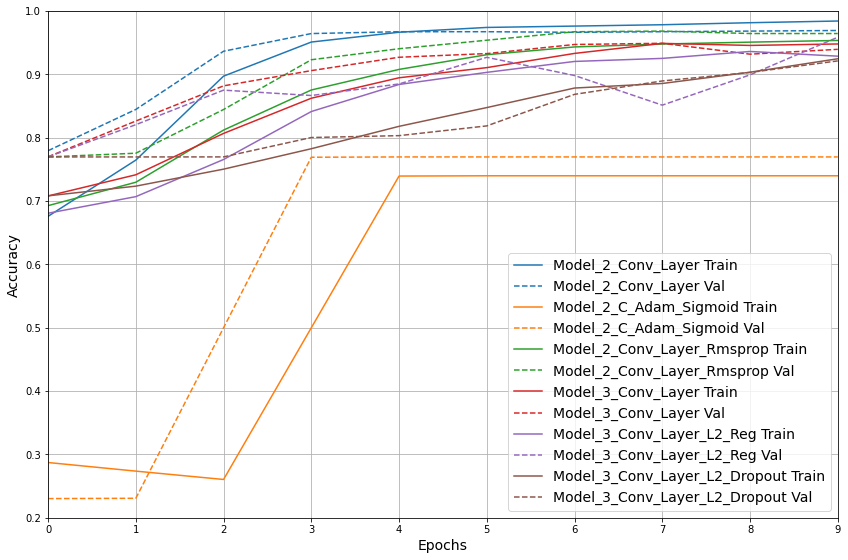

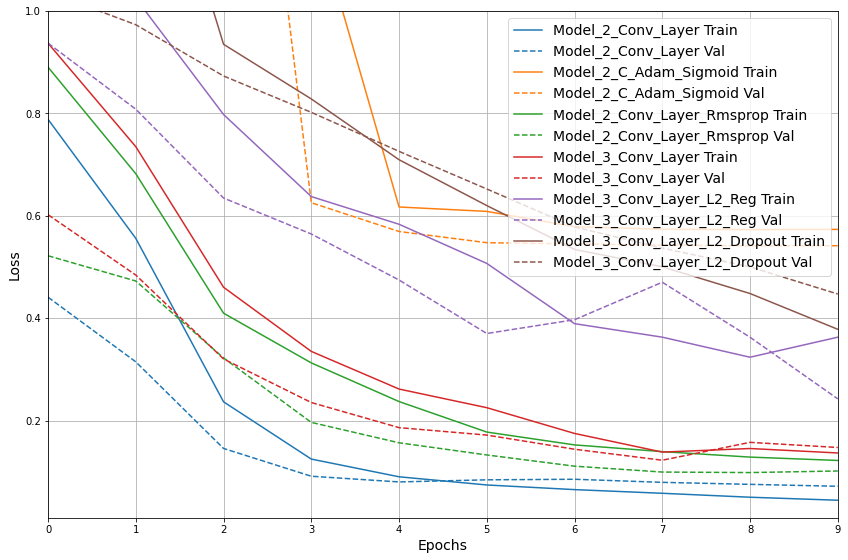

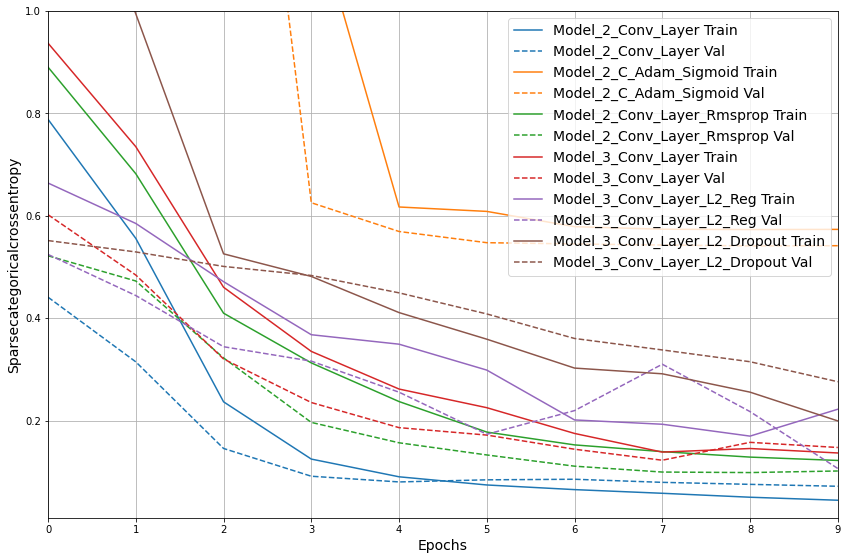

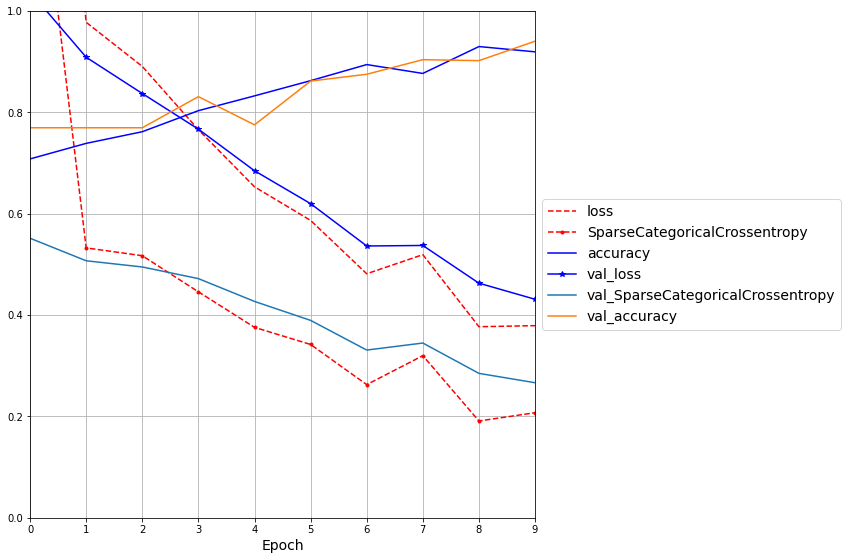

3/3 - 0s - loss: 0.6226 - SparseCategoricalCrossentropy: 0.4579 - accuracy: 0.7500 - 74ms/epoch - 25ms/step
Accuracy on Test Data is : 0.75
16/16 - 0s - loss: 0.4358 - SparseCategoricalCrossentropy: 0.2712 - accuracy: 0.9470 - 323ms/epoch - 20ms/step
Accuracy on Train Data is : 0.9469648599624634
===== Classification Report  for Test Data set =====
3/3 [==============================] - 0s 12ms/step
              precision    recall  f1-score   support

           0       0.35      0.94      0.52        88
           1       0.99      0.72      0.83       536

    accuracy                           0.75       624
   macro avg       0.67      0.83      0.67       624
weighted avg       0.90      0.75      0.79       624

[[ 83 151]
 [  5 385]]
AUC: 0.670940170940171


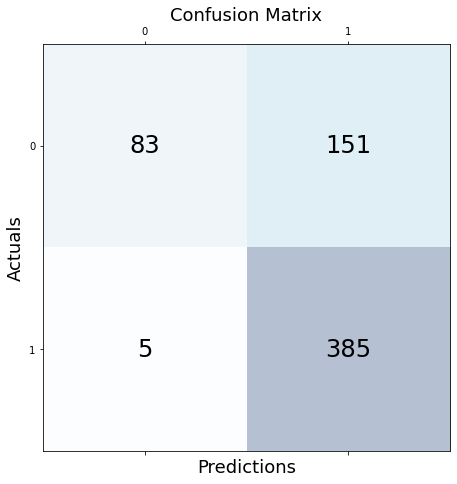

===== Classification Report  for Train Data set =====
16/16 [==============================] - 0s 15ms/step
              precision    recall  f1-score   support

           0       0.85      0.94      0.89      1112
           1       0.98      0.95      0.96      3583

    accuracy                           0.95      4695
   macro avg       0.92      0.94      0.93      4695
weighted avg       0.95      0.95      0.95      4695

[[1042  179]
 [  70 3404]]
AUC: 0.9166245850183674


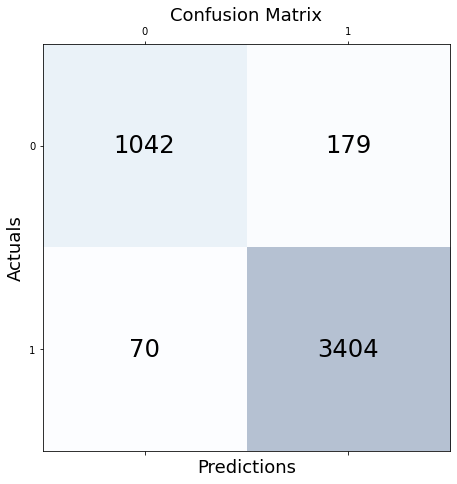

(<keras.callbacks.History at 0x7fb9fff47430>,
 {'model_2_conv_layer': <keras.callbacks.History at 0x7fba235fb400>,
  'model_2_c_Adam_sigmoid': <keras.callbacks.History at 0x7fba2323faf0>,
  'model_2_conv_layer_RMSprop': <keras.callbacks.History at 0x7fba22343100>,
  'model_3_conv_layer': <keras.callbacks.History at 0x7fba8c8e9760>,
  'model_3_conv_layer_L2_reg': <keras.callbacks.History at 0x7fba8c6c7100>,
  'model_3_conv_layer_L2_dropout': <keras.callbacks.History at 0x7fb9fff47430>})

In [74]:
# Compile, train and evaluate the model
model_history_name = 'model_3_conv_layer_L2_dropout'
lr_schedule=None
optimizer = 'RMSProp'
test_model(model_3_c_L2_dropout, model_history_name,size_histories,model_history_name,lr_schedule,optimizer)

**Conclusion**
- The accuracy on training data set has reduced and model now seems to be generalising bit better.
- if number of Epochs was increased the  Accuracy of training data set would decrease. Due to limitation of hardware this has not been implemented.

#### **Data Augmentation**

Here,we will define a CNN model with
- 3 Convolution lyers and maxpooling layers
- dropout layer with drop rate of 30% at input and all output layers
- Data augmentation pre processing layer for randomly flipping and rotating a % of training data set images 

In [75]:
# Instantiate model instance
model_3_c_L2_dropout_data_aug = define_3_conv_layer_model_dropouts_data_aug( 
                        filters = 16,
                        filter_size = (3,3),
                        strides=(1,1),
                        padding='same',
                        activation='relu',
                        img_height=img_height,
                        img_width=img_width,
                        kernel_regularizer=regularizers.l2(0.01),
                        pool_size=(2, 2),
                        drop_rate=0.2
                        )

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 120, 120, 1)       0         
                                                                 
 random_flip (RandomFlip)    (None, 120, 120, 1)       0         
                                                                 
 random_rotation (RandomRota  (None, 120, 120, 1)      0         
 tion)                                                           
                                                                 
 dropout (Dropout)           (None, 120, 120, 1)       0         
                                                                 
 Convolution-Layer-1 (Conv2D  (None, 120, 120, 16)     160       
 )                                                               
                                                                 
 dropout_1 (Dropout)         (None, 120, 120, 16)      0

======== Model Layers ========
rescaling
random_flip
random_rotation
dropout
Convolution-Layer-1
dropout_1
MaxPooling-Layer-1
Convolution-Layer-2
dropout_2
MaxPooling-Layer-2
Convolution-Layer-3
dropout_3
MaxPooling-Layer-3
flatten
dense_1
dropout_4
predictions
Epoch 1/10


16/16 [==============================] - ETA: 0s - loss: 2.2039 - SparseCategoricalCrossentropy: 1.6421 - accuracy: 0.7059
Epoch: 0, SparseCategoricalCrossentropy:1.6421,  accuracy:0.7059,  loss:2.2039,  val_SparseCategoricalCrossentropy:0.5967,  val_accuracy:0.7697,  val_loss:1.0844,  
16/16 [==============================] - 46s 3s/step - loss: 2.2039 - SparseCategoricalCrossentropy: 1.6421 - accuracy: 0.7059 - val_loss: 1.0844 - val_SparseCategoricalCrossentropy: 0.5967 - val_accuracy: 0.7697
Epoch 2/10
16/16 [==============================] - 43s 3s/step - loss: 1.0121 - SparseCategoricalCrossentropy: 0.5694 - accuracy: 0.7169 - val_loss: 0.9677 - val_SparseCategoricalCrossentropy: 0.5734 - val_accuracy: 0.7697
Epoch 3/10
16/16 [==============================] - 43s 3s/step - loss: 0.9233 - SparseCategoricalCrossentropy: 0.5634 - accuracy: 0.7201 - val_loss: 0.9891 - val_SparseCategoricalCrossentropy: 0.6673 - val_accuracy: 0.8311
Epoch 4/10
16/16 [==============================] -

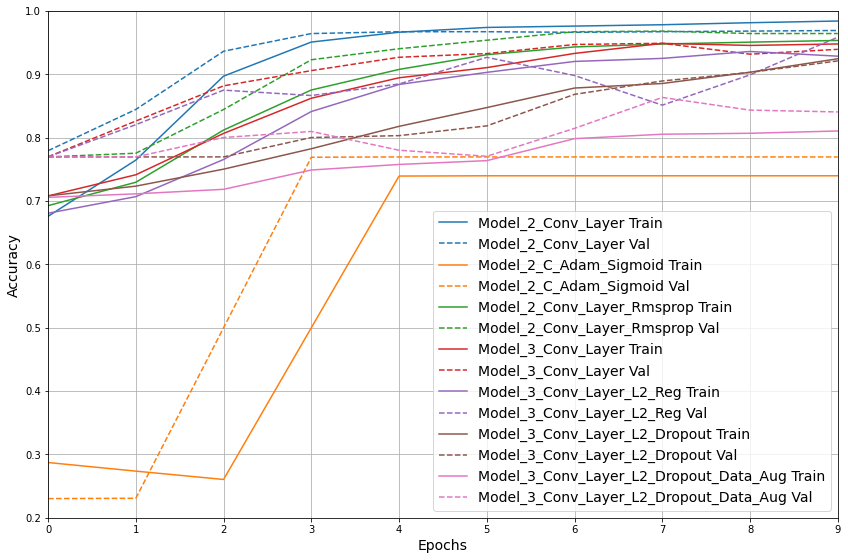

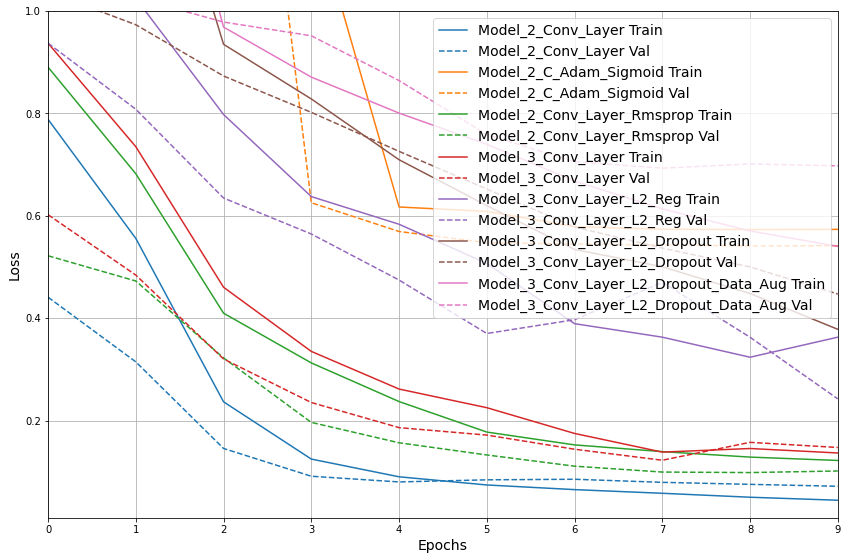

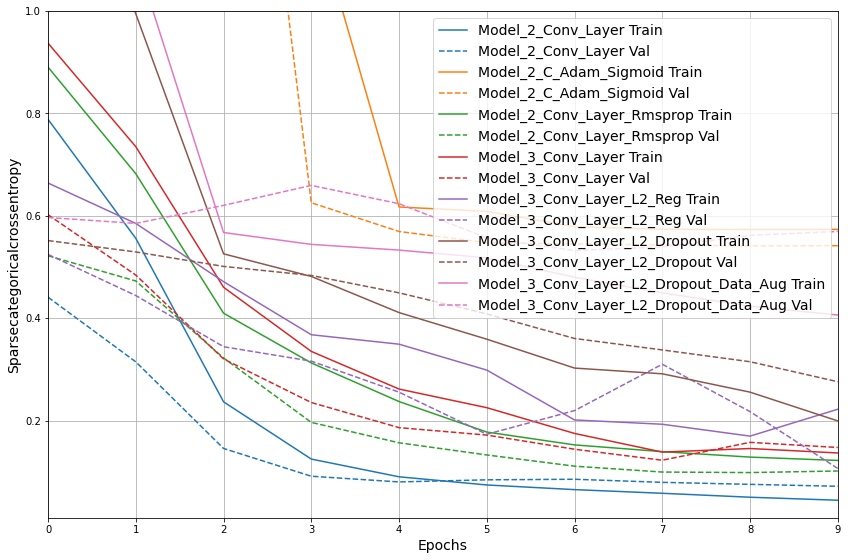

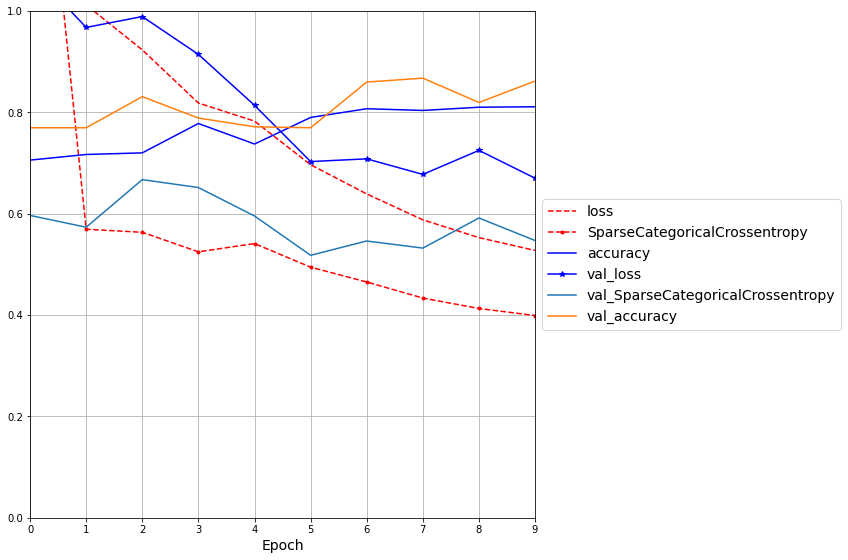

3/3 - 0s - loss: 0.6878 - SparseCategoricalCrossentropy: 0.5648 - accuracy: 0.8125 - 66ms/epoch - 22ms/step
Accuracy on Test Data is : 0.8125
16/16 - 0s - loss: 0.6715 - SparseCategoricalCrossentropy: 0.5486 - accuracy: 0.8486 - 339ms/epoch - 21ms/step
Accuracy on Train Data is : 0.8485623002052307
===== Classification Report  for Test Data set =====
3/3 [==============================] - 0s 15ms/step
              precision    recall  f1-score   support

           0       0.59      0.87      0.70       157
           1       0.95      0.79      0.86       467

    accuracy                           0.81       624
   macro avg       0.77      0.83      0.78       624
weighted avg       0.86      0.81      0.82       624

[[137  97]
 [ 20 370]]
AUC: 0.767094017094017


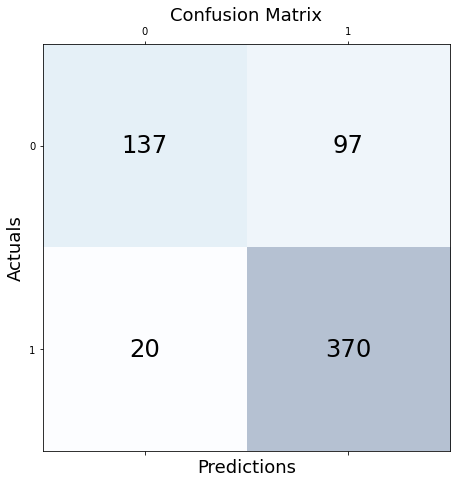

===== Classification Report  for Train Data set =====
16/16 [==============================] - 0s 15ms/step
              precision    recall  f1-score   support

           0       0.64      0.74      0.69      1064
           1       0.92      0.88      0.90      3631

    accuracy                           0.85      4695
   macro avg       0.78      0.81      0.79      4695
weighted avg       0.86      0.85      0.85      4695

[[ 787  434]
 [ 277 3197]]
AUC: 0.7824092344817735


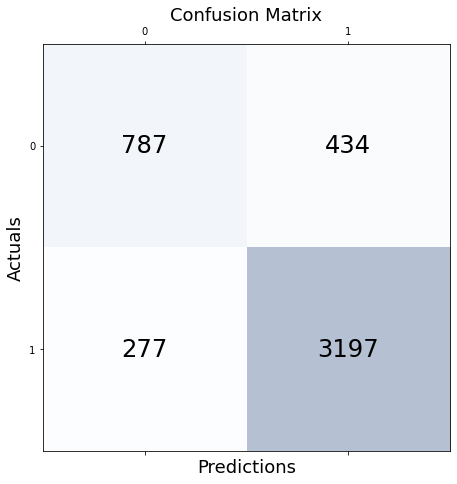

(<keras.callbacks.History at 0x7fba8c09b640>,
 {'model_2_conv_layer': <keras.callbacks.History at 0x7fba235fb400>,
  'model_2_c_Adam_sigmoid': <keras.callbacks.History at 0x7fba2323faf0>,
  'model_2_conv_layer_RMSprop': <keras.callbacks.History at 0x7fba22343100>,
  'model_3_conv_layer': <keras.callbacks.History at 0x7fba8c8e9760>,
  'model_3_conv_layer_L2_reg': <keras.callbacks.History at 0x7fba8c6c7100>,
  'model_3_conv_layer_L2_dropout': <keras.callbacks.History at 0x7fb9fff47430>,
  'model_3_conv_layer_L2_dropout_data_aug': <keras.callbacks.History at 0x7fba8c09b640>})

In [76]:
# Compile, train and evaluate the model
model_history_name = 'model_3_conv_layer_L2_dropout_data_aug'
lr_schedule=None
optimizer = 'RMSProp'
test_model(model_3_c_L2_dropout_data_aug, model_history_name,size_histories,model_history_name,lr_schedule,optimizer)

**Conclusion**
- The model generalises much better as accuracy for training data set has reduced to 85%
- if number of Epochs was increased the  Accuracy of training data set would decrease. Due to limitation of hardware this has not been implemented.

# **Part 3:** Hyperparameter Tuning

In [77]:
def model_final_builder(hp):
    num_classes = len(class_names)
    model = keras.Sequential()
  # Input layer
    model.add(keras.layers.Rescaling(1./255, input_shape=(img_height, img_width, 1)))
  # Data augmentation layer
    layers.RandomFlip("horizontal_and_vertical",seed=200),
    layers.RandomRotation(0.2,seed=200),
  # Drop out   
    hp_drop_rate_1 = hp.Choice('drop_rate_1', values=[0.2,0.3,0.4,0.5])
    model.add(keras.layers.Dropout(hp_drop_rate_1))
  # Convolution Block 1  
    hp_filters_1=hp.Choice('filters_1', values=[8,16])
    hp_kernel_size_1=hp.Choice('kernel_size_1', values=[3,5,7])
    hp_strides_1=hp.Choice('strides_1', values=[1,2])
    hp_padding_1=hp.Choice('padding_1', values=['valid','same'])
  # hp_kernel_regularizer = hp.Choice('kernel_regularizer', values=[regularizers.l1(0.01),regularizers.l1(0.001),regularizers.l2(0.01),regularizers.l2(0.001)])
    hp_activation_1=hp.Choice('activation_func_1',values=['relu','sigmoid',])
    model.add(keras.layers.Conv2D(filters=hp_filters_1,
                    kernel_size=hp_kernel_size_1,
                    strides=hp_strides_1,
                    padding=hp_padding_1,
                    kernel_regularizer=regularizers.l2(0.01),
                    activation=hp_activation_1,
                    name='Convolution-Layer-1'),)
  # Drop out   
    hp_drop_rate_2 = hp.Choice('drop_rate_2', values=[0.2,0.3,0.4,0.5])
    model.add(keras.layers.Dropout(hp_drop_rate_2))
  # MaxPooling-1
    hp_pool_size_1=hp.Choice('pool_size_1', values=[2,3])
    hp_pool_strides_1=hp.Choice('pool_strides_1', values=[1,2])
    hp_pool_padding_1=hp.Choice('pool_padding_1', values=['valid','same'])
    model.add(keras.layers.MaxPooling2D(pool_size=hp_pool_size_1,strides=hp_pool_strides_1,padding=hp_pool_padding_1,name='MaxPooling-Layer-1',))
    
  # Convolution Block 2 
    hp_filters_2=hp.Choice('filters_2', values=[32,64])
    hp_kernel_size_2=hp.Choice('kernel_size_2', values=[3,5,7])
    hp_strides_2=hp.Choice('strides_2', values=[1,2])
    hp_padding_2=hp.Choice('padding_2', values=['valid','same'])
  # hp_kernel_regularizer = hp.Choice('kernel_regularizer', values=[regularizers.l1(0.01),regularizers.l1(0.001),regularizers.l2(0.01),regularizers.l2(0.001)])
    hp_activation_2=hp.Choice('activation_func_2',values=['relu','sigmoid',])
    model.add(keras.layers.Conv2D(filters=hp_filters_2,
                    kernel_size=hp_kernel_size_2,
                    strides=hp_strides_2,
                    padding=hp_padding_2,
                    kernel_regularizer=regularizers.l2(0.01),
                    activation=hp_activation_2,
                    name='Convolution-Layer-2'),)
  # Drop out   
    hp_drop_rate_3 = hp.Choice('drop_rate_3', values=[0.2,0.3,0.4,0.5])
    model.add(keras.layers.Dropout(hp_drop_rate_3))
  # MaxPooling-2
    hp_pool_size_2=hp.Choice('pool_size_2', values=[2,3])
    hp_pool_strides_2=hp.Choice('pool_strides_2', values=[1,2])
    hp_pool_padding_2=hp.Choice('pool_padding_2', values=['valid','same'])
    model.add(keras.layers.MaxPooling2D(pool_size=hp_pool_size_2,strides=hp_pool_strides_2,padding=hp_pool_padding_2,name='MaxPooling-Layer-2',))
    
  # Convolution Block 3 
    hp_filters_3=hp.Choice('filters_3', values=[64,128])
    hp_kernel_size_3=hp.Choice('kernel_size_3', values=[3,5,7])
    hp_strides_3=hp.Choice('strides_3', values=[1,2])
    hp_padding_3=hp.Choice('padding_3', values=['valid','same'])
  # hp_kernel_regularizer = hp.Choice('kernel_regularizer', values=[regularizers.l1(0.01),regularizers.l1(0.001),regularizers.l2(0.01),regularizers.l2(0.001)])
    hp_activation_3=hp.Choice('activation_func_3',values=['relu','sigmoid',])
    model.add(keras.layers.Conv2D(filters=hp_filters_3,
                    kernel_size=hp_kernel_size_3,
                    strides=hp_strides_3,
                    padding=hp_padding_3,
                    kernel_regularizer=regularizers.l2(0.01),
                    activation=hp_activation_3,
                    name='Convolution-Layer-3'),)
  # Drop out   
    hp_drop_rate_4 = hp.Choice('drop_rate_4', values=[0.2,0.3,0.4,0.5])
    model.add(keras.layers.Dropout(hp_drop_rate_4))
  # MaxPooling-3
    hp_pool_size_3=hp.Choice('pool_size_3', values=[2])
    hp_pool_strides_3=hp.Choice('pool_strides_3', values=[2])
    hp_pool_padding_3=hp.Choice('pool_padding_3', values=['valid'])
    model.add(keras.layers.MaxPooling2D(pool_size=hp_pool_size_3,strides=hp_pool_strides_3,padding=hp_pool_padding_3,name='MaxPooling-Layer-3',))
    
  # Flattening layer
    model.add(keras.layers.Flatten())
  
  # Dense connected layer -1
    hp_units1 = hp.Int('units_1', min_value=32, max_value=512, step=32)
    hp_activation_D1=hp.Choice('activation_func_D1',values=['relu','sigmoid',])
    model.add(keras.layers.Dense(hp_units1, activation=hp_activation_D1,name="dense_1")),  
  # Drop out   
    hp_drop_rate_5 = hp.Choice('drop_rate_5', values=[0.2,0.3,0.4,0.5])
    model.add(keras.layers.Dropout(hp_drop_rate_5)) 
    
  # # Dense connected layer -2 
  #   hp_units2 = hp.Int('units_2', min_value=32, max_value=512, step=32)
  #   hp_activation_D2=hp.Choice('activation_func_D2',values=['relu','sigmoid',])
  #   model.add(keras.layers.Dense(hp_units2, activation=hp_activation_D2,name="dense_2")),  
  # # Drop out   
  #   hp_drop_rate_6 = hp.Choice('drop_rate_6', values=[0.2,0.3,0.4,0.5])
  #   model.add(keras.layers.Dropout(hp_drop_rate_6)) 
     
  # Output layer
    model.add(keras.layers.Dense(num_classes,activation="softmax",name="predictions")) 
              
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])

    return model

### Hyperband Tuner

In [78]:
# Instantiate the tuner to perform the hypertuning. The Keras Tuner has four tuners available - RandomSearch, Hyperband, BayesianOptimization, and Sklearn. 
# Here we will use Hyperband tuner.
tuner_HB = kt.Hyperband(model_final_builder,
                     objective='accuracy',
                     max_epochs=30,
                     factor=3,
                     directory='hyperparameter_logs/Hyperband',
                     project_name='CSCK506_End_of_Module_Assignment')

In [79]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=1)

In [80]:
tuner_HB.search(data_val, epochs=30, callbacks=[stop_early])

# Get the optimal hyperparameters
best_hps_HB=tuner_HB.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The hyperparameter search is complete for Hyperband. 
""")

Trial 86 Complete [00h 00m 29s]
accuracy: 0.7696737051010132

Best accuracy So Far: 0.7715930938720703
Total elapsed time: 00h 09m 13s

The hyperparameter search is complete for Hyperband. 



In [81]:
print(f""" Best parameters for Drop Layer 1 """)
print(f"""      drop_rate = {best_hps_HB.get('drop_rate_1')}""")

print(f""" Best parameters for convolution layer 1 """)
print(f"""      Number of filters  = {best_hps_HB.get('filters_1')}""")
print(f"""      Filter size  = {best_hps_HB.get('kernel_size_1')}""")
print(f"""      Stride  = {best_hps_HB.get('strides_1')}""")
print(f"""      Padding  = {best_hps_HB.get('padding_1')}""")
print(f"""      Activation Function  = {best_hps_HB.get('activation_func_1')}""")
print(f""" Best parameters for Drop Layer 2 """)
print(f"""      drop_rate = {best_hps_HB.get('drop_rate_2')}""")
print(f""" Best parameters for Max pooling Layer 1 """)
print(f"""      pool_size = {best_hps_HB.get('pool_size_1')}""")
print(f"""      pool_strides = {best_hps_HB.get('pool_strides_1')}""")
print(f"""      pool_padding = {best_hps_HB.get('pool_padding_1')}""")

print(f""" Best parameters for convolution layer 2 """)
print(f"""      Number of filters  = {best_hps_HB.get('filters_2')}""")
print(f"""      Filter size  = {best_hps_HB.get('kernel_size_2')}""")
print(f"""      Stride  = {best_hps_HB.get('strides_2')}""")
print(f"""      Padding  = {best_hps_HB.get('padding_2')}""")
print(f"""      Activation Function  = {best_hps_HB.get('activation_func_2')}""")
print(f""" Best parameters for Drop Layer 3 """)
print(f"""      drop_rate = {best_hps_HB.get('drop_rate_3')}""")
print(f""" Best parameters for Max pooling Layer 2 """)
print(f"""      pool_size = {best_hps_HB.get('pool_size_2')}""")
print(f"""      pool_strides = {best_hps_HB.get('pool_strides_2')}""")
print(f"""      pool_padding = {best_hps_HB.get('pool_padding_2')}""")

print(f""" Best parameters for convolution layer 3 """)
print(f"""      Number of filters  = {best_hps_HB.get('filters_3')}""")
print(f"""      Filter size  = {best_hps_HB.get('kernel_size_3')}""")
print(f"""      Stride  = {best_hps_HB.get('strides_3')}""")
print(f"""      Padding  = {best_hps_HB.get('padding_3')}""")
print(f"""      Activation Function  = {best_hps_HB.get('activation_func_3')}""")
print(f""" Best parameters for Drop Layer 4 """)
print(f"""      drop_rate = {best_hps_HB.get('drop_rate_4')}""")
print(f""" Best parameters for Max pooling Layer 3 """)
print(f"""      pool_size = {best_hps_HB.get('pool_size_3')}""")
print(f"""      pool_strides = {best_hps_HB.get('pool_strides_3')}""")
print(f"""      pool_padding = {best_hps_HB.get('pool_padding_3')}""")

print(f""" Best parameters for Densed Layer 1 """)
print(f"""      number of neurons = {best_hps_HB.get('units_1')}""")
print(f"""      number of neurons = {best_hps_HB.get('activation_func_D1')}""")
print(f""" Best parameters for Drop Layer 5 """)
print(f"""      drop_rate = {best_hps_HB.get('drop_rate_5')}""")

# print(f""" Best parameters for Densed Layer 2 """)
# print(f"""      number of neurons = {best_hps_HB.get('units_2')}""")
# print(f"""      number of neurons = {best_hps_HB.get('activation_func_D2')}""")
# print(f""" Best parameters for Drop Layer 6 """)
# print(f"""      drop_rate = {best_hps_HB.get('drop_rate_6')}""")

print(f""" Best parameters for Model compilation """)
print(f"""      Learning Rate = {best_hps_HB.get('learning_rate')}""")


 Best parameters for Drop Layer 1 
      drop_rate = 0.4
 Best parameters for convolution layer 1 
      Number of filters  = 8
      Filter size  = 7
      Stride  = 1
      Padding  = same
      Activation Function  = relu
 Best parameters for Drop Layer 2 
      drop_rate = 0.3
 Best parameters for Max pooling Layer 1 
      pool_size = 3
      pool_strides = 2
      pool_padding = valid
 Best parameters for convolution layer 2 
      Number of filters  = 32
      Filter size  = 5
      Stride  = 2
      Padding  = valid
      Activation Function  = relu
 Best parameters for Drop Layer 3 
      drop_rate = 0.3
 Best parameters for Max pooling Layer 2 
      pool_size = 2
      pool_strides = 1
      pool_padding = valid
 Best parameters for convolution layer 3 
      Number of filters  = 64
      Filter size  = 7
      Stride  = 2
      Padding  = same
      Activation Function  = relu
 Best parameters for Drop Layer 4 
      drop_rate = 0.3
 Best parameters for Max pooling Layer 3 

### RandomSearch Tuner

In [83]:
tuner_RS = kt.RandomSearch(
    hypermodel=model_final_builder,
    objective="accuracy",
    max_trials=30,
    seed=250,
    directory="hyperparameter_logs/RandomSearch",
    project_name="CSCK506_End_of_Module_Assignment",
)

In [84]:
tuner_RS.search(data_val, epochs=30, callbacks=[stop_early])

# Get the optimal hyperparameters
best_hps_RS=tuner_RS.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The hyperparameter search is complete for Random Search. 
""")

Trial 30 Complete [00h 00m 15s]
accuracy: 0.7696737051010132

Best accuracy So Far: 0.7696737051010132
Total elapsed time: 00h 04m 05s

The hyperparameter search is complete for Random Search. 



In [85]:
print(f""" Best parameters for Drop Layer 1 """)
print(f"""      drop_rate = {best_hps_RS.get('drop_rate_1')}""")

print(f""" Best parameters for convolution layer 1 """)
print(f"""      Number of filters  = {best_hps_RS.get('filters_1')}""")
print(f"""      Filter size  = {best_hps_RS.get('kernel_size_1')}""")
print(f"""      Stride  = {best_hps_RS.get('strides_1')}""")
print(f"""      Padding  = {best_hps_RS.get('padding_1')}""")
print(f"""      Activation Function  = {best_hps_RS.get('activation_func_1')}""")
print(f""" Best parameters for Drop Layer 2 """)
print(f"""      drop_rate = {best_hps_RS.get('drop_rate_2')}""")
print(f""" Best parameters for Max pooling Layer 1 """)
print(f"""      pool_size = {best_hps_RS.get('pool_size_1')}""")
print(f"""      pool_strides = {best_hps_RS.get('pool_strides_1')}""")
print(f"""      pool_padding = {best_hps_RS.get('pool_padding_1')}""")

print(f""" Best parameters for convolution layer 2 """)
print(f"""      Number of filters  = {best_hps_RS.get('filters_2')}""")
print(f"""      Filter size  = {best_hps_RS.get('kernel_size_2')}""")
print(f"""      Stride  = {best_hps_RS.get('strides_2')}""")
print(f"""      Padding  = {best_hps_RS.get('padding_2')}""")
print(f"""      Activation Function  = {best_hps_RS.get('activation_func_2')}""")
print(f""" Best parameters for Drop Layer 3 """)
print(f"""      drop_rate = {best_hps_RS.get('drop_rate_3')}""")
print(f""" Best parameters for Max pooling Layer 2 """)
print(f"""      pool_size = {best_hps_RS.get('pool_size_2')}""")
print(f"""      pool_strides = {best_hps_RS.get('pool_strides_2')}""")
print(f"""      pool_padding = {best_hps_RS.get('pool_padding_2')}""")

print(f""" Best parameters for convolution layer 3 """)
print(f"""      Number of filters  = {best_hps_RS.get('filters_3')}""")
print(f"""      Filter size  = {best_hps_RS.get('kernel_size_3')}""")
print(f"""      Stride  = {best_hps_RS.get('strides_3')}""")
print(f"""      Padding  = {best_hps_RS.get('padding_3')}""")
print(f"""      Activation Function  = {best_hps_RS.get('activation_func_3')}""")
print(f""" Best parameters for Drop Layer 4 """)
print(f"""      drop_rate = {best_hps_RS.get('drop_rate_4')}""")
print(f""" Best parameters for Max pooling Layer 3 """)
print(f"""      pool_size = {best_hps_RS.get('pool_size_3')}""")
print(f"""      pool_strides = {best_hps_RS.get('pool_strides_3')}""")
print(f"""      pool_padding = {best_hps_RS.get('pool_padding_3')}""")

print(f""" Best parameters for Densed Layer 1 """)
print(f"""      number of neurons = {best_hps_RS.get('units_1')}""")
print(f"""      number of neurons = {best_hps_RS.get('activation_func_D1')}""")
print(f""" Best parameters for Drop Layer 5 """)
print(f"""      drop_rate = {best_hps_RS.get('drop_rate_5')}""")

# print(f""" Best parameters for Densed Layer 2 """)
# print(f"""      number of neurons = {best_hps_RS.get('units_2')}""")
# print(f"""      number of neurons = {best_hps_RS.get('activation_func_D2')}""")
# print(f""" Best parameters for Drop Layer 6 """)
# print(f"""      drop_rate = {best_hps_RS.get('drop_rate_6')}""")

print(f""" Best parameters for Model compilation """)
print(f"""      Learning Rate = {best_hps_RS.get('learning_rate')}""")

 Best parameters for Drop Layer 1 
      drop_rate = 0.4
 Best parameters for convolution layer 1 
      Number of filters  = 16
      Filter size  = 3
      Stride  = 2
      Padding  = valid
      Activation Function  = sigmoid
 Best parameters for Drop Layer 2 
      drop_rate = 0.5
 Best parameters for Max pooling Layer 1 
      pool_size = 3
      pool_strides = 2
      pool_padding = same
 Best parameters for convolution layer 2 
      Number of filters  = 64
      Filter size  = 5
      Stride  = 1
      Padding  = same
      Activation Function  = relu
 Best parameters for Drop Layer 3 
      drop_rate = 0.4
 Best parameters for Max pooling Layer 2 
      pool_size = 2
      pool_strides = 1
      pool_padding = same
 Best parameters for convolution layer 3 
      Number of filters  = 64
      Filter size  = 7
      Stride  = 1
      Padding  = valid
      Activation Function  = relu
 Best parameters for Drop Layer 4 
      drop_rate = 0.3
 Best parameters for Max pooling Layer

### Train model best hyper parameters
Hyperband gave higher accuracy and so we will us parameters identified by this Tuner.

### Cross validate accuracy on test dataset

In [88]:
# Build the model with the optimal hyperparameters and train it on the training dataset for 15 epochs
model = tuner_HB.hypermodel.build(best_hps_HB)
history = model.fit(data_train, epochs=15)

train_acc_per_epoch = history.history['accuracy']
best_epoch = train_acc_per_epoch.index(max(train_acc_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/15
16/16 [==============================] - 3s 84ms/step - loss: 1.4516 - accuracy: 0.6351
Epoch 2/15
16/16 [==============================] - 1s 63ms/step - loss: 0.9827 - accuracy: 0.7399
Epoch 3/15
16/16 [==============================] - 1s 61ms/step - loss: 0.8966 - accuracy: 0.7399
Epoch 4/15
16/16 [==============================] - 1s 61ms/step - loss: 0.8384 - accuracy: 0.7399
Epoch 5/15
16/16 [==============================] - 1s 60ms/step - loss: 0.6987 - accuracy: 0.7806
Epoch 6/15
16/16 [==============================] - 1s 62ms/step - loss: 0.5522 - accuracy: 0.8601
Epoch 7/15
16/16 [==============================] - 1s 62ms/step - loss: 0.4498 - accuracy: 0.9044
Epoch 8/15
16/16 [==============================] - 1s 61ms/step - loss: 0.3924 - accuracy: 0.9252
Epoch 9/15
16/16 [==============================] - 1s 61ms/step - loss: 0.3588 - accuracy: 0.9374
Epoch 10/15
16/16 [==============================] - 1s 61ms/step - loss: 0.3433 - accuracy: 0.9353
Epoch 11/

===== Classification Report  for Train Data set =====
16/16 [==============================] - 0s 19ms/step
              precision    recall  f1-score   support

           0       0.91      0.96      0.93      1164
           1       0.99      0.97      0.98      3531

    accuracy                           0.97      4695
   macro avg       0.95      0.96      0.95      4695
weighted avg       0.97      0.97      0.97      4695

[[1112  109]
 [  52 3422]]
AUC: 0.9478802872585256


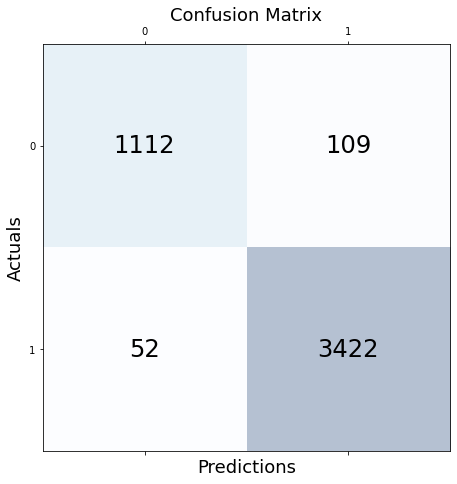

In [89]:
model_history_name = "model_3_Conv_Layer_tuned"
# Visulaise the training results
size_histories[model_history_name] = history
# visualise_results(size_histories,model_history_name)

print("===== Classification Report  for Train Data set =====")
print_confusion_matrix(model,data_train)

In [90]:
#Re-instantiate the hypermodel and train it with the optimal number of epochs from above
hypermodel = tuner_HB.hypermodel.build(best_hps_HB)

# Retrain the model
hypermodel_history=hypermodel.fit(data_train, epochs=best_epoch)

Epoch 1/14
16/16 [==============================] - 5s 67ms/step - loss: 1.2510 - accuracy: 0.6816
Epoch 2/14
16/16 [==============================] - 1s 61ms/step - loss: 0.9357 - accuracy: 0.7399
Epoch 3/14
16/16 [==============================] - 1s 60ms/step - loss: 0.7704 - accuracy: 0.7966
Epoch 4/14
16/16 [==============================] - 1s 62ms/step - loss: 0.6075 - accuracy: 0.8660
Epoch 5/14
16/16 [==============================] - 1s 61ms/step - loss: 0.5073 - accuracy: 0.8961
Epoch 6/14
16/16 [==============================] - 1s 61ms/step - loss: 0.4485 - accuracy: 0.9137
Epoch 7/14
16/16 [==============================] - 1s 61ms/step - loss: 0.3920 - accuracy: 0.9312
Epoch 8/14
16/16 [==============================] - 1s 64ms/step - loss: 0.3631 - accuracy: 0.9350
Epoch 9/14
16/16 [==============================] - 1s 64ms/step - loss: 0.3411 - accuracy: 0.9346
Epoch 10/14
16/16 [==============================] - 1s 63ms/step - loss: 0.3153 - accuracy: 0.9391
Epoch 11/

===== Classification Report  for Train Data set =====
16/16 [==============================] - 0s 21ms/step
              precision    recall  f1-score   support

           0       0.82      0.97      0.89      1026
           1       0.99      0.94      0.96      3669

    accuracy                           0.95      4695
   macro avg       0.90      0.96      0.93      4695
weighted avg       0.95      0.95      0.95      4695

[[ 997  224]
 [  29 3445]]
AUC: 0.9040980452897551


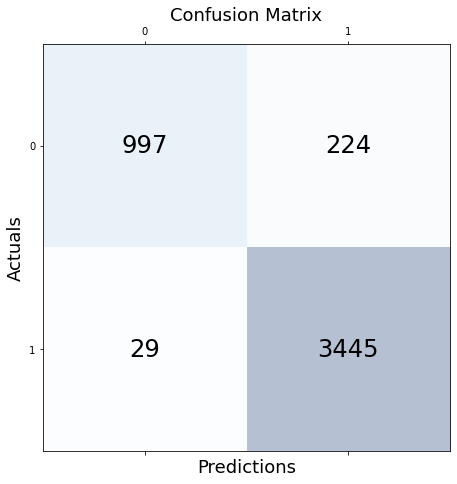

In [91]:
model_history_name = "model_3_Conv_Layer_tuned_opt_epochs"
# Visulaise the training results
# size_histories[model_history_name] = hypermodel_history
# visualise_results(size_histories,model_history_name)

print("===== Classification Report  for Train Data set =====")
print_confusion_matrix(hypermodel,data_train)

In [92]:
eval_result = hypermodel.evaluate(data_test)
print("[test loss, test accuracy]:", eval_result)

3/3 [==============================] - 0s 45ms/step - loss: 0.6254 - accuracy: 0.6987
[test loss, test accuracy]: [0.6254472732543945, 0.6987179517745972]


# Download Images and logs

In [95]:
from google.colab import files
files.download( "/content/images" ) 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [96]:
files.download( "/content/logs" )

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [97]:
files.download( "/content/hyperparameter_logs" )

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# SaveLogs to Tensor Board

In [98]:
logdir

PosixPath('/tmp/tmpmfgzush0/tensorboard_logs')

In [99]:
!lsof -i:6006

In [100]:
!kill -9 PID 28572

/bin/bash: line 0: kill: PID: arguments must be process or job IDs
/bin/bash: line 0: kill: (28572) - No such process


In [106]:
#docs_infra: no_execute

# Load the TensorBoard notebook extension
%reload_ext tensorboard

# Open an embedded TensorBoard viewer
%tensorboard --logdir {logdir}


Reusing TensorBoard on port 6006 (pid 26435), started 0:01:00 ago. (Use '!kill 26435' to kill it.)

<IPython.core.display.Javascript object>

In [102]:
! tensorboard dev upload --logdir logs \
    --name "End of Module Assignment" \
    --description "Deep Learning - End of Module Assignment"

2023-03-19 22:51:01.746079: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-19 22:51:01.746197: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-19 22:51:01.746216: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.

***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

logs

This TensorBoard will be vis

In [105]:
display.IFrame(
    src="https://tensorboard.dev/experiment/xDDi1kjiReOwdmp1QvYUng/",
    width="100%", height="800px")


Finding the right hyper parameters (stries, padding, learning rate, activation functions etc) is a tricky task! But luckily, we can be a little lazy and just try a bunch of combinations and see what works best! 